**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints"
log_dir = "D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_logs"

Checkpoints will be saved to: D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_logs


Reusing TensorBoard on port 6010 (pid 4976), started 4 days, 18:00:46 ago. (Use '!kill 4976' to kill it.)

In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


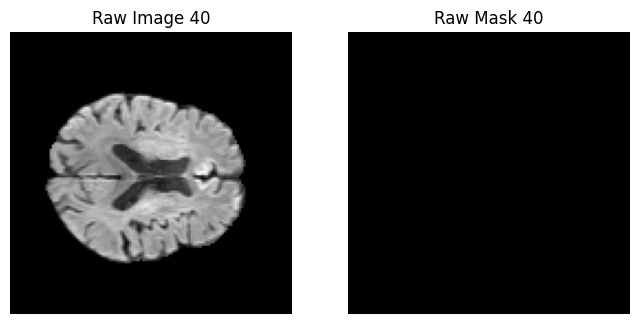

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


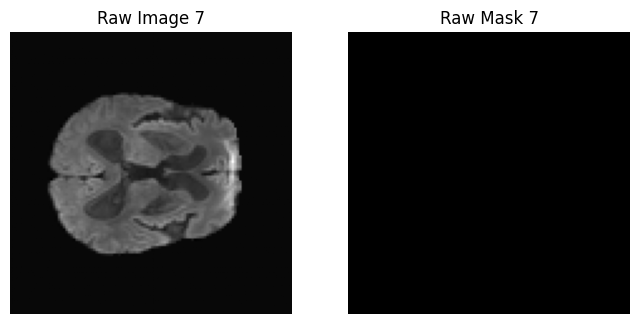

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


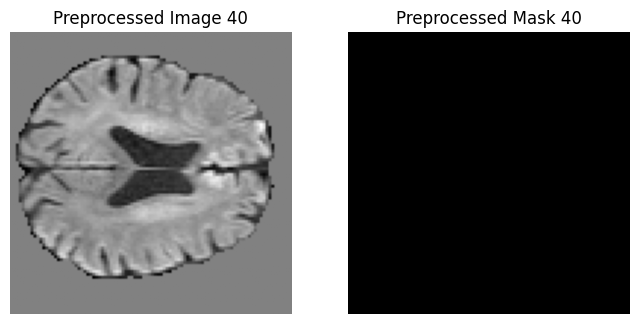

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


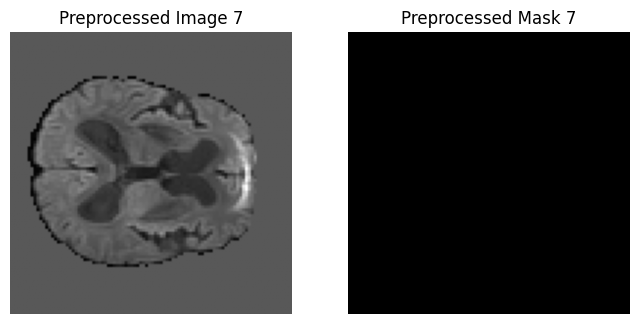

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


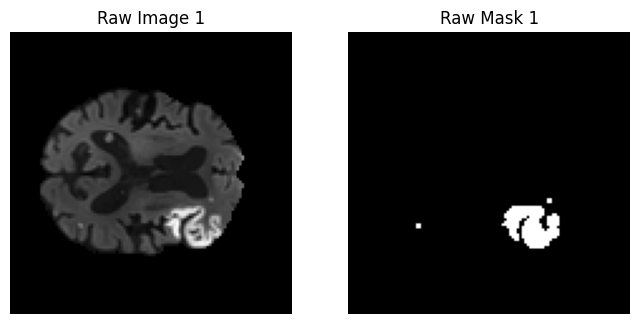

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


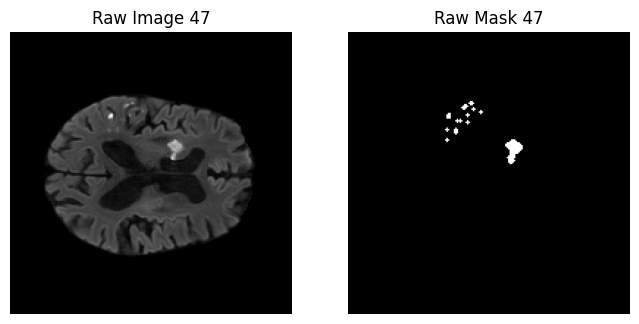

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


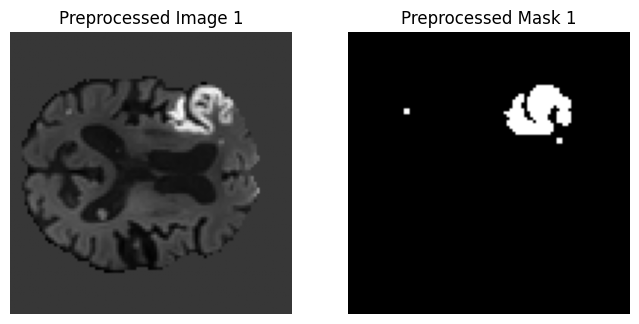

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


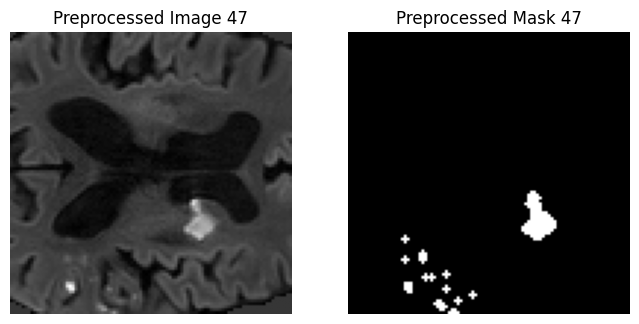

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


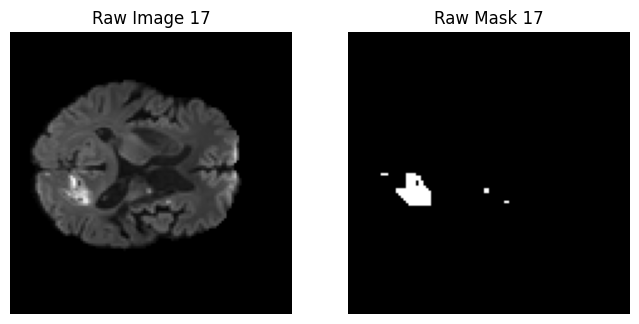

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


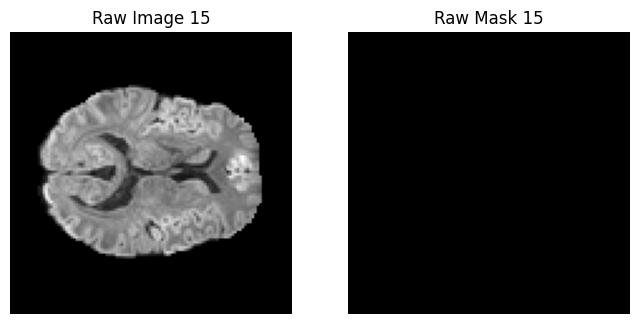

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


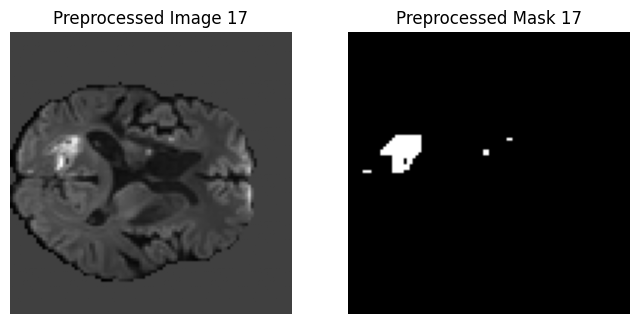

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


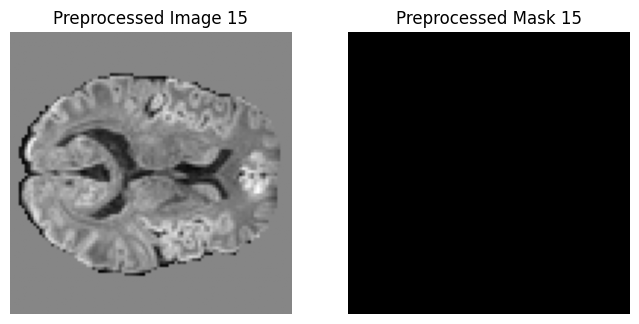

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)
        
        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [14]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

**Client Class**

In [15]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0 
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [16]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0 
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

Using device: cuda
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(

**Federated Training loop**

In [18]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")
    
     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.8493 | Dice: 0.1014 | IoU: 0.0534 | HD95: 43.2218


Client 0 | Epoch 2/20 | Loss: 0.8277 | Dice: 0.1615 | IoU: 0.0878 | HD95: 36.9615


Client 0 | Epoch 3/20 | Loss: 0.8195 | Dice: 0.1805 | IoU: 0.0992 | HD95: 35.5881


Client 0 | Epoch 4/20 | Loss: 0.8142 | Dice: 0.2002 | IoU: 0.1112 | HD95: 34.9710


Client 0 | Epoch 5/20 | Loss: 0.8078 | Dice: 0.1991 | IoU: 0.1106 | HD95: 34.2430


Client 0 | Epoch 6/20 | Loss: 0.8035 | Dice: 0.2312 | IoU: 0.1307 | HD95: 33.7373


Client 0 | Epoch 7/20 | Loss: 0.7985 | Dice: 0.2262 | IoU: 0.1275 | HD95: 34.3363


Client 0 | Epoch 8/20 | Loss: 0.7935 | Dice: 0.2445 | IoU: 0.1393 | HD95: 32.5041


Client 0 | Epoch 9/20 | Loss: 0.7896 | Dice: 0.2761 | IoU: 0.1602 | HD95: 30.2085


Client 0 | Epoch 10/20 | Loss: 0.7853 | Dice: 0.2722 | IoU: 0.1575 | HD95: 30.0933


Client 0 | Epoch 11/20 | Loss: 0.7825 | Dice: 0.2625 | IoU: 0.1511 | HD95: 33.1112


Client 0 | Epoch 12/20 | Loss: 0.7787 | Dice: 0.2634 | IoU: 0.1517 | HD95: 31.3624


Client 0 | Epoch 13/20 | Loss: 0.7742 | Dice: 0.2756 | IoU: 0.1598 | HD95: 31.4610


Client 0 | Epoch 14/20 | Loss: 0.7704 | Dice: 0.2891 | IoU: 0.1690 | HD95: 29.7579


Client 0 | Epoch 15/20 | Loss: 0.7668 | Dice: 0.3189 | IoU: 0.1897 | HD95: 26.7929


Client 0 | Epoch 16/20 | Loss: 0.7633 | Dice: 0.2843 | IoU: 0.1657 | HD95: 28.2792


Client 0 | Epoch 17/20 | Loss: 0.7605 | Dice: 0.2878 | IoU: 0.1681 | HD95: 30.2540


Client 0 | Epoch 18/20 | Loss: 0.7569 | Dice: 0.3184 | IoU: 0.1893 | HD95: 28.8352


Client 0 | Epoch 19/20 | Loss: 0.7539 | Dice: 0.3189 | IoU: 0.1897 | HD95: 29.0309


Clients Training:  33%|███▎      | 1/3 [02:44<05:28, 164.15s/it]

Client 0 | Epoch 20/20 | Loss: 0.7497 | Dice: 0.3620 | IoU: 0.2210 | HD95: 26.7681
Client 0 | Loss=0.7873 | Dice=0.3620 | IoU=0.2210 | HD95=26.7681


Client 1 | Epoch 1/20 | Loss: 0.8478 | Dice: 0.1066 | IoU: 0.0563 | HD95: 39.4866


Client 1 | Epoch 2/20 | Loss: 0.8282 | Dice: 0.1621 | IoU: 0.0882 | HD95: 34.4090


Client 1 | Epoch 3/20 | Loss: 0.8195 | Dice: 0.1944 | IoU: 0.1077 | HD95: 33.6886


Client 1 | Epoch 4/20 | Loss: 0.8132 | Dice: 0.2154 | IoU: 0.1207 | HD95: 33.2609


Client 1 | Epoch 5/20 | Loss: 0.8078 | Dice: 0.2274 | IoU: 0.1283 | HD95: 32.0976


Client 1 | Epoch 6/20 | Loss: 0.8037 | Dice: 0.2227 | IoU: 0.1253 | HD95: 32.6366


Client 1 | Epoch 7/20 | Loss: 0.7992 | Dice: 0.2369 | IoU: 0.1344 | HD95: 33.8032


Client 1 | Epoch 8/20 | Loss: 0.7943 | Dice: 0.2405 | IoU: 0.1367 | HD95: 31.6652


Client 1 | Epoch 9/20 | Loss: 0.7900 | Dice: 0.2697 | IoU: 0.1559 | HD95: 31.2254


Client 1 | Epoch 10/20 | Loss: 0.7859 | Dice: 0.2742 | IoU: 0.1589 | HD95: 31.5079


Client 1 | Epoch 11/20 | Loss: 0.7827 | Dice: 0.2949 | IoU: 0.1729 | HD95: 30.0270


Client 1 | Epoch 12/20 | Loss: 0.7798 | Dice: 0.2849 | IoU: 0.1661 | HD95: 29.9536


Client 1 | Epoch 13/20 | Loss: 0.7743 | Dice: 0.3157 | IoU: 0.1875 | HD95: 28.2755


Client 1 | Epoch 14/20 | Loss: 0.7726 | Dice: 0.2941 | IoU: 0.1724 | HD95: 31.6558


Client 1 | Epoch 15/20 | Loss: 0.7682 | Dice: 0.3310 | IoU: 0.1983 | HD95: 30.0489


Client 1 | Epoch 16/20 | Loss: 0.7641 | Dice: 0.3279 | IoU: 0.1961 | HD95: 28.1946


Client 1 | Epoch 17/20 | Loss: 0.7604 | Dice: 0.3367 | IoU: 0.2024 | HD95: 25.7721


Client 1 | Epoch 18/20 | Loss: 0.7570 | Dice: 0.3674 | IoU: 0.2251 | HD95: 27.5464


Client 1 | Epoch 19/20 | Loss: 0.7539 | Dice: 0.3575 | IoU: 0.2177 | HD95: 26.1402


Clients Training:  67%|██████▋   | 2/3 [05:33<02:47, 167.25s/it]

Client 1 | Epoch 20/20 | Loss: 0.7515 | Dice: 0.3486 | IoU: 0.2111 | HD95: 27.9394
Client 1 | Loss=0.7877 | Dice=0.3486 | IoU=0.2111 | HD95=27.9394


Client 2 | Epoch 1/20 | Loss: 0.8478 | Dice: 0.1168 | IoU: 0.0620 | HD95: 39.6213


Client 2 | Epoch 2/20 | Loss: 0.8263 | Dice: 0.1862 | IoU: 0.1027 | HD95: 37.0495


Client 2 | Epoch 3/20 | Loss: 0.8175 | Dice: 0.2276 | IoU: 0.1284 | HD95: 36.8045


Client 2 | Epoch 4/20 | Loss: 0.8108 | Dice: 0.2643 | IoU: 0.1522 | HD95: 35.4303


Client 2 | Epoch 5/20 | Loss: 0.8049 | Dice: 0.2766 | IoU: 0.1605 | HD95: 35.1155


Client 2 | Epoch 6/20 | Loss: 0.7990 | Dice: 0.3096 | IoU: 0.1832 | HD95: 31.8793


Client 2 | Epoch 7/20 | Loss: 0.7937 | Dice: 0.3151 | IoU: 0.1870 | HD95: 34.0597


Client 2 | Epoch 8/20 | Loss: 0.7917 | Dice: 0.3178 | IoU: 0.1889 | HD95: 33.5656


Client 2 | Epoch 9/20 | Loss: 0.7853 | Dice: 0.3550 | IoU: 0.2158 | HD95: 29.3791


Client 2 | Epoch 10/20 | Loss: 0.7822 | Dice: 0.3443 | IoU: 0.2080 | HD95: 31.3812


Client 2 | Epoch 11/20 | Loss: 0.7779 | Dice: 0.3518 | IoU: 0.2134 | HD95: 31.9346


Client 2 | Epoch 12/20 | Loss: 0.7733 | Dice: 0.3662 | IoU: 0.2242 | HD95: 28.8008


Client 2 | Epoch 13/20 | Loss: 0.7694 | Dice: 0.3844 | IoU: 0.2380 | HD95: 29.0365


Client 2 | Epoch 14/20 | Loss: 0.7663 | Dice: 0.3940 | IoU: 0.2453 | HD95: 29.0614


Client 2 | Epoch 15/20 | Loss: 0.7622 | Dice: 0.3810 | IoU: 0.2353 | HD95: 29.4200


Client 2 | Epoch 16/20 | Loss: 0.7583 | Dice: 0.3917 | IoU: 0.2436 | HD95: 27.9655


Client 2 | Epoch 17/20 | Loss: 0.7554 | Dice: 0.4150 | IoU: 0.2618 | HD95: 26.6323


Client 2 | Epoch 18/20 | Loss: 0.7512 | Dice: 0.4219 | IoU: 0.2674 | HD95: 26.0128


Client 2 | Epoch 19/20 | Loss: 0.7478 | Dice: 0.4201 | IoU: 0.2659 | HD95: 24.6991


Client 2 Epochs: 100%|██████████| 20/20 [02:45<00:00,  8.26s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7441 | Dice: 0.4271 | IoU: 0.2715 | HD95: 24.6751
Client 2 | Loss=0.7833 | Dice=0.4271 | IoU=0.2715 | HD95=24.6751


Best global model updated with Dice=0.2931
Global | Val Loss=0.7583 | Dice=0.2931 | IoU=0.1717 | HD95=32.8114
Checkpoint saved for round 1 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7482 | Dice: 0.3096 | IoU: 0.1832 | HD95: 32.2505


Client 0 | Epoch 2/20 | Loss: 0.7447 | Dice: 0.3117 | IoU: 0.1846 | HD95: 29.2544


Client 0 | Epoch 3/20 | Loss: 0.7417 | Dice: 0.3184 | IoU: 0.1893 | HD95: 28.5397


Client 0 | Epoch 4/20 | Loss: 0.7377 | Dice: 0.3345 | IoU: 0.2008 | HD95: 27.4813


Client 0 | Epoch 5/20 | Loss: 0.7346 | Dice: 0.3479 | IoU: 0.2106 | HD95: 28.1798


Client 0 | Epoch 6/20 | Loss: 0.7318 | Dice: 0.3573 | IoU: 0.2175 | HD95: 27.8471


Client 0 | Epoch 7/20 | Loss: 0.7340 | Dice: 0.2846 | IoU: 0.1659 | HD95: 30.1625


Client 0 | Epoch 8/20 | Loss: 0.7276 | Dice: 0.3278 | IoU: 0.1960 | HD95: 28.7071


Client 0 | Epoch 9/20 | Loss: 0.7243 | Dice: 0.3338 | IoU: 0.2003 | HD95: 31.2965


Client 0 | Epoch 10/20 | Loss: 0.7201 | Dice: 0.3876 | IoU: 0.2404 | HD95: 27.5932


Client 0 | Epoch 11/20 | Loss: 0.7177 | Dice: 0.3707 | IoU: 0.2275 | HD95: 27.1751


Client 0 | Epoch 12/20 | Loss: 0.7142 | Dice: 0.4179 | IoU: 0.2642 | HD95: 28.4607


Client 0 | Epoch 13/20 | Loss: 0.7156 | Dice: 0.3849 | IoU: 0.2383 | HD95: 28.5256


Client 0 | Epoch 14/20 | Loss: 0.7130 | Dice: 0.3187 | IoU: 0.1896 | HD95: 29.9953


Client 0 | Epoch 15/20 | Loss: 0.7092 | Dice: 0.3774 | IoU: 0.2326 | HD95: 29.6009


Client 0 | Epoch 16/20 | Loss: 0.7059 | Dice: 0.3587 | IoU: 0.2185 | HD95: 24.8617


Client 0 | Epoch 17/20 | Loss: 0.7020 | Dice: 0.4123 | IoU: 0.2597 | HD95: 23.8275


Client 0 | Epoch 18/20 | Loss: 0.6982 | Dice: 0.4531 | IoU: 0.2929 | HD95: 22.9681


Client 0 | Epoch 19/20 | Loss: 0.6953 | Dice: 0.4718 | IoU: 0.3087 | HD95: 24.9374


Clients Training:  33%|███▎      | 1/3 [02:37<05:14, 157.27s/it]

Client 0 | Epoch 20/20 | Loss: 0.6927 | Dice: 0.4778 | IoU: 0.3139 | HD95: 22.2251
Client 0 | Loss=0.7204 | Dice=0.4778 | IoU=0.3139 | HD95=22.2251


Client 1 | Epoch 1/20 | Loss: 0.7488 | Dice: 0.3514 | IoU: 0.2132 | HD95: 28.6954


Client 1 | Epoch 2/20 | Loss: 0.7449 | Dice: 0.3585 | IoU: 0.2184 | HD95: 25.9721


Client 1 | Epoch 3/20 | Loss: 0.7424 | Dice: 0.3587 | IoU: 0.2186 | HD95: 26.6429


Client 1 | Epoch 4/20 | Loss: 0.7399 | Dice: 0.3665 | IoU: 0.2243 | HD95: 28.2076


Client 1 | Epoch 5/20 | Loss: 0.7372 | Dice: 0.3646 | IoU: 0.2229 | HD95: 26.8482


Client 1 | Epoch 6/20 | Loss: 0.7331 | Dice: 0.3814 | IoU: 0.2356 | HD95: 26.0499


Client 1 | Epoch 7/20 | Loss: 0.7297 | Dice: 0.4107 | IoU: 0.2584 | HD95: 24.8743


Client 1 | Epoch 8/20 | Loss: 0.7284 | Dice: 0.3678 | IoU: 0.2253 | HD95: 26.4588


Client 1 | Epoch 9/20 | Loss: 0.7258 | Dice: 0.3806 | IoU: 0.2350 | HD95: 23.5804


Client 1 | Epoch 10/20 | Loss: 0.7219 | Dice: 0.4014 | IoU: 0.2511 | HD95: 24.1257


Client 1 | Epoch 11/20 | Loss: 0.7197 | Dice: 0.3743 | IoU: 0.2302 | HD95: 24.0306


Client 1 | Epoch 12/20 | Loss: 0.7155 | Dice: 0.4343 | IoU: 0.2773 | HD95: 23.9578


Client 1 | Epoch 13/20 | Loss: 0.7126 | Dice: 0.4359 | IoU: 0.2787 | HD95: 23.6898


Client 1 | Epoch 14/20 | Loss: 0.7108 | Dice: 0.4001 | IoU: 0.2501 | HD95: 24.7981


Client 1 | Epoch 15/20 | Loss: 0.7079 | Dice: 0.4104 | IoU: 0.2582 | HD95: 21.2996


Client 1 | Epoch 16/20 | Loss: 0.7041 | Dice: 0.4651 | IoU: 0.3030 | HD95: 21.4202


Client 1 | Epoch 17/20 | Loss: 0.7011 | Dice: 0.4466 | IoU: 0.2875 | HD95: 21.7302


Client 1 | Epoch 18/20 | Loss: 0.6988 | Dice: 0.4527 | IoU: 0.2925 | HD95: 20.0873


Client 1 | Epoch 19/20 | Loss: 0.6952 | Dice: 0.4685 | IoU: 0.3059 | HD95: 20.9998


Clients Training:  67%|██████▋   | 2/3 [05:16<02:38, 158.26s/it]

Client 1 | Epoch 20/20 | Loss: 0.6931 | Dice: 0.4733 | IoU: 0.3100 | HD95: 19.1378
Client 1 | Loss=0.7205 | Dice=0.4733 | IoU=0.3100 | HD95=19.1378


Client 2 | Epoch 1/20 | Loss: 0.7432 | Dice: 0.3725 | IoU: 0.2289 | HD95: 29.3719


Client 2 | Epoch 2/20 | Loss: 0.7385 | Dice: 0.4161 | IoU: 0.2627 | HD95: 27.9439


Client 2 | Epoch 3/20 | Loss: 0.7369 | Dice: 0.4101 | IoU: 0.2580 | HD95: 28.1625


Client 2 | Epoch 4/20 | Loss: 0.7324 | Dice: 0.4216 | IoU: 0.2671 | HD95: 27.0531


Client 2 | Epoch 5/20 | Loss: 0.7288 | Dice: 0.4346 | IoU: 0.2776 | HD95: 25.4530


Client 2 | Epoch 6/20 | Loss: 0.7253 | Dice: 0.4525 | IoU: 0.2924 | HD95: 24.1415


Client 2 | Epoch 7/20 | Loss: 0.7221 | Dice: 0.4562 | IoU: 0.2955 | HD95: 22.7230


Client 2 | Epoch 8/20 | Loss: 0.7204 | Dice: 0.4346 | IoU: 0.2776 | HD95: 25.6836


Client 2 | Epoch 9/20 | Loss: 0.7162 | Dice: 0.4564 | IoU: 0.2956 | HD95: 21.5367


Client 2 | Epoch 10/20 | Loss: 0.7143 | Dice: 0.4338 | IoU: 0.2769 | HD95: 22.9047


Client 2 | Epoch 11/20 | Loss: 0.7097 | Dice: 0.4893 | IoU: 0.3239 | HD95: 21.0994


Client 2 | Epoch 12/20 | Loss: 0.7066 | Dice: 0.4868 | IoU: 0.3217 | HD95: 19.1017


Client 2 | Epoch 13/20 | Loss: 0.7036 | Dice: 0.4967 | IoU: 0.3304 | HD95: 20.0370


Client 2 | Epoch 14/20 | Loss: 0.7006 | Dice: 0.4884 | IoU: 0.3231 | HD95: 20.9400


Client 2 | Epoch 15/20 | Loss: 0.6980 | Dice: 0.4799 | IoU: 0.3157 | HD95: 21.2103


Client 2 | Epoch 16/20 | Loss: 0.6945 | Dice: 0.5207 | IoU: 0.3520 | HD95: 17.6598


Client 2 | Epoch 17/20 | Loss: 0.6915 | Dice: 0.5178 | IoU: 0.3493 | HD95: 19.1948


Client 2 | Epoch 18/20 | Loss: 0.6888 | Dice: 0.4983 | IoU: 0.3318 | HD95: 20.0521


Client 2 | Epoch 19/20 | Loss: 0.6854 | Dice: 0.5216 | IoU: 0.3528 | HD95: 18.7528


Client 2 Epochs: 100%|██████████| 20/20 [02:37<00:00,  7.88s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6819 | Dice: 0.5456 | IoU: 0.3752 | HD95: 16.5936
Client 2 | Loss=0.7119 | Dice=0.5456 | IoU=0.3752 | HD95=16.5936


Best global model updated with Dice=0.3506
Global | Val Loss=0.7104 | Dice=0.3506 | IoU=0.2125 | HD95=27.1948
Checkpoint saved for round 2 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6924 | Dice: 0.4399 | IoU: 0.2820 | HD95: 24.7538


Client 0 | Epoch 2/20 | Loss: 0.6915 | Dice: 0.3946 | IoU: 0.2458 | HD95: 26.3629


Client 0 | Epoch 3/20 | Loss: 0.6856 | Dice: 0.4294 | IoU: 0.2734 | HD95: 23.4357


Client 0 | Epoch 4/20 | Loss: 0.6828 | Dice: 0.4469 | IoU: 0.2877 | HD95: 24.1355


Client 0 | Epoch 5/20 | Loss: 0.6798 | Dice: 0.4757 | IoU: 0.3121 | HD95: 21.2824


Client 0 | Epoch 6/20 | Loss: 0.6759 | Dice: 0.4926 | IoU: 0.3267 | HD95: 22.6574


Client 0 | Epoch 7/20 | Loss: 0.6727 | Dice: 0.5130 | IoU: 0.3450 | HD95: 18.7125


Client 0 | Epoch 8/20 | Loss: 0.6721 | Dice: 0.4728 | IoU: 0.3096 | HD95: 24.2184


Client 0 | Epoch 9/20 | Loss: 0.6681 | Dice: 0.4791 | IoU: 0.3150 | HD95: 23.3442


Client 0 | Epoch 10/20 | Loss: 0.6651 | Dice: 0.5036 | IoU: 0.3366 | HD95: 20.6439


Client 0 | Epoch 11/20 | Loss: 0.6620 | Dice: 0.5163 | IoU: 0.3480 | HD95: 22.3038


Client 0 | Epoch 12/20 | Loss: 0.6586 | Dice: 0.5311 | IoU: 0.3616 | HD95: 19.9790


Client 0 | Epoch 13/20 | Loss: 0.6555 | Dice: 0.5415 | IoU: 0.3713 | HD95: 16.2495


Client 0 | Epoch 14/20 | Loss: 0.6524 | Dice: 0.5487 | IoU: 0.3780 | HD95: 14.8197


Client 0 | Epoch 15/20 | Loss: 0.6502 | Dice: 0.5412 | IoU: 0.3710 | HD95: 16.0089


Client 0 | Epoch 16/20 | Loss: 0.6466 | Dice: 0.5463 | IoU: 0.3758 | HD95: 17.9803


Client 0 | Epoch 17/20 | Loss: 0.6439 | Dice: 0.5503 | IoU: 0.3796 | HD95: 18.3213


Client 0 | Epoch 18/20 | Loss: 0.6401 | Dice: 0.5611 | IoU: 0.3899 | HD95: 15.2186


Client 0 | Epoch 19/20 | Loss: 0.6366 | Dice: 0.5766 | IoU: 0.4051 | HD95: 14.6044


Clients Training:  33%|███▎      | 1/3 [02:33<05:07, 153.91s/it]

Client 0 | Epoch 20/20 | Loss: 0.6331 | Dice: 0.5768 | IoU: 0.4053 | HD95: 13.6226
Client 0 | Loss=0.6633 | Dice=0.5768 | IoU=0.4053 | HD95=13.6226


Client 1 | Epoch 1/20 | Loss: 0.6968 | Dice: 0.3537 | IoU: 0.2148 | HD95: 27.7916


Client 1 | Epoch 2/20 | Loss: 0.6944 | Dice: 0.3493 | IoU: 0.2116 | HD95: 28.9266


Client 1 | Epoch 3/20 | Loss: 0.6896 | Dice: 0.3699 | IoU: 0.2269 | HD95: 27.7619


Client 1 | Epoch 4/20 | Loss: 0.6841 | Dice: 0.4270 | IoU: 0.2714 | HD95: 22.1070


Client 1 | Epoch 5/20 | Loss: 0.6804 | Dice: 0.4299 | IoU: 0.2738 | HD95: 23.3573


Client 1 | Epoch 6/20 | Loss: 0.6771 | Dice: 0.4658 | IoU: 0.3036 | HD95: 20.5528


Client 1 | Epoch 7/20 | Loss: 0.6739 | Dice: 0.4614 | IoU: 0.2999 | HD95: 20.0769


Client 1 | Epoch 8/20 | Loss: 0.6714 | Dice: 0.4589 | IoU: 0.2978 | HD95: 24.5315


Client 1 | Epoch 9/20 | Loss: 0.6687 | Dice: 0.4687 | IoU: 0.3061 | HD95: 20.3274


Client 1 | Epoch 10/20 | Loss: 0.6708 | Dice: 0.3944 | IoU: 0.2456 | HD95: 26.6749


Client 1 | Epoch 11/20 | Loss: 0.6731 | Dice: 0.3565 | IoU: 0.2169 | HD95: 28.0040


Client 1 | Epoch 12/20 | Loss: 0.6630 | Dice: 0.4042 | IoU: 0.2533 | HD95: 25.0863


Client 1 | Epoch 13/20 | Loss: 0.6568 | Dice: 0.4548 | IoU: 0.2943 | HD95: 20.1258


Client 1 | Epoch 14/20 | Loss: 0.6526 | Dice: 0.4872 | IoU: 0.3221 | HD95: 17.9739


Client 1 | Epoch 15/20 | Loss: 0.6485 | Dice: 0.4996 | IoU: 0.3330 | HD95: 17.7059


Client 1 | Epoch 16/20 | Loss: 0.6450 | Dice: 0.4976 | IoU: 0.3312 | HD95: 18.2640


Client 1 | Epoch 17/20 | Loss: 0.6412 | Dice: 0.5259 | IoU: 0.3568 | HD95: 14.0292


Client 1 | Epoch 18/20 | Loss: 0.6377 | Dice: 0.5112 | IoU: 0.3434 | HD95: 17.7007


Client 1 | Epoch 19/20 | Loss: 0.6335 | Dice: 0.5300 | IoU: 0.3606 | HD95: 15.1246


Clients Training:  67%|██████▋   | 2/3 [05:13<02:36, 156.98s/it]

Client 1 | Epoch 20/20 | Loss: 0.6292 | Dice: 0.5231 | IoU: 0.3542 | HD95: 15.1864
Client 1 | Loss=0.6644 | Dice=0.5231 | IoU=0.3542 | HD95=15.1864


Client 2 | Epoch 1/20 | Loss: 0.6832 | Dice: 0.4612 | IoU: 0.2997 | HD95: 21.6866


Client 2 | Epoch 2/20 | Loss: 0.6803 | Dice: 0.4557 | IoU: 0.2951 | HD95: 24.7396


Client 2 | Epoch 3/20 | Loss: 0.6770 | Dice: 0.4555 | IoU: 0.2950 | HD95: 23.9269


Client 2 | Epoch 4/20 | Loss: 0.6725 | Dice: 0.5026 | IoU: 0.3356 | HD95: 20.3556


Client 2 | Epoch 5/20 | Loss: 0.6694 | Dice: 0.5006 | IoU: 0.3338 | HD95: 22.8722


Client 2 | Epoch 6/20 | Loss: 0.6655 | Dice: 0.5177 | IoU: 0.3492 | HD95: 17.9786


Client 2 | Epoch 7/20 | Loss: 0.6617 | Dice: 0.5390 | IoU: 0.3689 | HD95: 18.7192


Client 2 | Epoch 8/20 | Loss: 0.6584 | Dice: 0.5608 | IoU: 0.3896 | HD95: 16.9331


Client 2 | Epoch 9/20 | Loss: 0.6550 | Dice: 0.5538 | IoU: 0.3829 | HD95: 15.3329


Client 2 | Epoch 10/20 | Loss: 0.6510 | Dice: 0.5679 | IoU: 0.3966 | HD95: 17.2760


Client 2 | Epoch 11/20 | Loss: 0.6479 | Dice: 0.5547 | IoU: 0.3838 | HD95: 17.2069


Client 2 | Epoch 12/20 | Loss: 0.6445 | Dice: 0.5575 | IoU: 0.3865 | HD95: 17.6259


Client 2 | Epoch 13/20 | Loss: 0.6400 | Dice: 0.5732 | IoU: 0.4018 | HD95: 17.7273


Client 2 | Epoch 14/20 | Loss: 0.6366 | Dice: 0.5738 | IoU: 0.4024 | HD95: 15.5371


Client 2 | Epoch 15/20 | Loss: 0.6320 | Dice: 0.5798 | IoU: 0.4083 | HD95: 17.4963


Client 2 | Epoch 16/20 | Loss: 0.6274 | Dice: 0.6000 | IoU: 0.4285 | HD95: 14.4341


Client 2 | Epoch 17/20 | Loss: 0.6229 | Dice: 0.5921 | IoU: 0.4205 | HD95: 12.8607


Client 2 | Epoch 18/20 | Loss: 0.6199 | Dice: 0.5965 | IoU: 0.4250 | HD95: 16.2756


Client 2 | Epoch 19/20 | Loss: 0.6315 | Dice: 0.4063 | IoU: 0.2550 | HD95: 26.7179


Client 2 Epochs: 100%|██████████| 20/20 [02:37<00:00,  7.89s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6165 | Dice: 0.5053 | IoU: 0.3380 | HD95: 24.3317
Client 2 | Loss=0.6497 | Dice=0.5053 | IoU=0.3380 | HD95=24.3317


Best global model updated with Dice=0.3562
Global | Val Loss=0.6675 | Dice=0.3562 | IoU=0.2167 | HD95=23.3315
Checkpoint saved for round 3 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6367 | Dice: 0.4413 | IoU: 0.2831 | HD95: 26.5105


Client 0 | Epoch 2/20 | Loss: 0.6444 | Dice: 0.3139 | IoU: 0.1861 | HD95: 32.4885


Client 0 | Epoch 3/20 | Loss: 0.6302 | Dice: 0.3963 | IoU: 0.2471 | HD95: 29.3864


Client 0 | Epoch 4/20 | Loss: 0.6223 | Dice: 0.4926 | IoU: 0.3268 | HD95: 21.5039


Client 0 | Epoch 5/20 | Loss: 0.6185 | Dice: 0.5106 | IoU: 0.3428 | HD95: 18.8621


Client 0 | Epoch 6/20 | Loss: 0.6134 | Dice: 0.5141 | IoU: 0.3460 | HD95: 20.3164


Client 0 | Epoch 7/20 | Loss: 0.6084 | Dice: 0.5721 | IoU: 0.4006 | HD95: 18.0286


Client 0 | Epoch 8/20 | Loss: 0.6058 | Dice: 0.5330 | IoU: 0.3633 | HD95: 21.7635


Client 0 | Epoch 9/20 | Loss: 0.5993 | Dice: 0.5859 | IoU: 0.4144 | HD95: 15.0907


Client 0 | Epoch 10/20 | Loss: 0.5954 | Dice: 0.5897 | IoU: 0.4181 | HD95: 15.7991


Client 0 | Epoch 11/20 | Loss: 0.5900 | Dice: 0.5974 | IoU: 0.4259 | HD95: 15.1466


Client 0 | Epoch 12/20 | Loss: 0.5856 | Dice: 0.6030 | IoU: 0.4317 | HD95: 14.7236


Client 0 | Epoch 13/20 | Loss: 0.5810 | Dice: 0.6012 | IoU: 0.4298 | HD95: 16.7024


Client 0 | Epoch 14/20 | Loss: 0.5755 | Dice: 0.6355 | IoU: 0.4658 | HD95: 13.0277


Client 0 | Epoch 15/20 | Loss: 0.5699 | Dice: 0.6120 | IoU: 0.4410 | HD95: 14.4941


Client 0 | Epoch 16/20 | Loss: 0.5651 | Dice: 0.6282 | IoU: 0.4580 | HD95: 14.9359


Client 0 | Epoch 17/20 | Loss: 0.5595 | Dice: 0.6368 | IoU: 0.4671 | HD95: 12.5670


Client 0 | Epoch 18/20 | Loss: 0.5537 | Dice: 0.6495 | IoU: 0.4809 | HD95: 12.1242


Client 0 | Epoch 19/20 | Loss: 0.5501 | Dice: 0.6313 | IoU: 0.4612 | HD95: 12.6817


Clients Training:  33%|███▎      | 1/3 [02:34<05:08, 154.13s/it]

Client 0 | Epoch 20/20 | Loss: 0.5421 | Dice: 0.6652 | IoU: 0.4984 | HD95: 10.7278
Client 0 | Loss=0.5924 | Dice=0.6652 | IoU=0.4984 | HD95=10.7278


Client 1 | Epoch 1/20 | Loss: 0.6334 | Dice: 0.4426 | IoU: 0.2842 | HD95: 20.8723


Client 1 | Epoch 2/20 | Loss: 0.6332 | Dice: 0.4192 | IoU: 0.2652 | HD95: 22.3887


Client 1 | Epoch 3/20 | Loss: 0.6307 | Dice: 0.4270 | IoU: 0.2715 | HD95: 26.2072


Client 1 | Epoch 4/20 | Loss: 0.6246 | Dice: 0.4073 | IoU: 0.2557 | HD95: 26.4916


Client 1 | Epoch 5/20 | Loss: 0.6145 | Dice: 0.5007 | IoU: 0.3340 | HD95: 21.2689


Client 1 | Epoch 6/20 | Loss: 0.6086 | Dice: 0.5106 | IoU: 0.3428 | HD95: 18.9040


Client 1 | Epoch 7/20 | Loss: 0.6031 | Dice: 0.5187 | IoU: 0.3502 | HD95: 17.7097


Client 1 | Epoch 8/20 | Loss: 0.5973 | Dice: 0.5443 | IoU: 0.3739 | HD95: 15.4963


Client 1 | Epoch 9/20 | Loss: 0.5910 | Dice: 0.5668 | IoU: 0.3955 | HD95: 14.5232


Client 1 | Epoch 10/20 | Loss: 0.5889 | Dice: 0.5295 | IoU: 0.3600 | HD95: 17.7560


Client 1 | Epoch 11/20 | Loss: 0.5852 | Dice: 0.5236 | IoU: 0.3546 | HD95: 19.1986


Client 1 | Epoch 12/20 | Loss: 0.5812 | Dice: 0.5075 | IoU: 0.3401 | HD95: 21.0584


Client 1 | Epoch 13/20 | Loss: 0.5745 | Dice: 0.5330 | IoU: 0.3633 | HD95: 18.7504


Client 1 | Epoch 14/20 | Loss: 0.5656 | Dice: 0.5847 | IoU: 0.4132 | HD95: 14.0484


Client 1 | Epoch 15/20 | Loss: 0.5615 | Dice: 0.5711 | IoU: 0.3997 | HD95: 12.7593


Client 1 | Epoch 16/20 | Loss: 0.5540 | Dice: 0.5849 | IoU: 0.4134 | HD95: 15.5526


Client 1 | Epoch 17/20 | Loss: 0.5474 | Dice: 0.5991 | IoU: 0.4277 | HD95: 13.8420


Client 1 | Epoch 18/20 | Loss: 0.5398 | Dice: 0.6030 | IoU: 0.4316 | HD95: 13.0429


Client 1 | Epoch 19/20 | Loss: 0.5321 | Dice: 0.6220 | IoU: 0.4514 | HD95: 12.1896


Clients Training:  67%|██████▋   | 2/3 [05:12<02:36, 156.72s/it]

Client 1 | Epoch 20/20 | Loss: 0.5286 | Dice: 0.6148 | IoU: 0.4438 | HD95: 13.7200
Client 1 | Loss=0.5848 | Dice=0.6148 | IoU=0.4438 | HD95=13.7200


Client 2 | Epoch 1/20 | Loss: 0.6122 | Dice: 0.5189 | IoU: 0.3504 | HD95: 19.0145


Client 2 | Epoch 2/20 | Loss: 0.6090 | Dice: 0.5377 | IoU: 0.3677 | HD95: 21.5563


Client 2 | Epoch 3/20 | Loss: 0.6018 | Dice: 0.5666 | IoU: 0.3953 | HD95: 16.7519


Client 2 | Epoch 4/20 | Loss: 0.5964 | Dice: 0.5777 | IoU: 0.4062 | HD95: 18.1124


Client 2 | Epoch 5/20 | Loss: 0.5914 | Dice: 0.5575 | IoU: 0.3865 | HD95: 18.7888


Client 2 | Epoch 6/20 | Loss: 0.5868 | Dice: 0.5740 | IoU: 0.4025 | HD95: 19.7916


Client 2 | Epoch 7/20 | Loss: 0.5812 | Dice: 0.5920 | IoU: 0.4204 | HD95: 16.2887


Client 2 | Epoch 8/20 | Loss: 0.5753 | Dice: 0.5966 | IoU: 0.4251 | HD95: 17.2953


Client 2 | Epoch 9/20 | Loss: 0.5680 | Dice: 0.6032 | IoU: 0.4318 | HD95: 13.7250


Client 2 | Epoch 10/20 | Loss: 0.5616 | Dice: 0.6291 | IoU: 0.4589 | HD95: 12.1950


Client 2 | Epoch 11/20 | Loss: 0.5557 | Dice: 0.6360 | IoU: 0.4663 | HD95: 12.7737


Client 2 | Epoch 12/20 | Loss: 0.5512 | Dice: 0.6208 | IoU: 0.4501 | HD95: 14.2717


Client 2 | Epoch 13/20 | Loss: 0.5457 | Dice: 0.6165 | IoU: 0.4456 | HD95: 14.0402


Client 2 | Epoch 14/20 | Loss: 0.5374 | Dice: 0.6373 | IoU: 0.4677 | HD95: 14.0497


Client 2 | Epoch 15/20 | Loss: 0.5300 | Dice: 0.6771 | IoU: 0.5118 | HD95: 11.0004


Client 2 | Epoch 16/20 | Loss: 0.5230 | Dice: 0.6631 | IoU: 0.4960 | HD95: 14.2923


Client 2 | Epoch 17/20 | Loss: 0.5155 | Dice: 0.6511 | IoU: 0.4827 | HD95: 12.7792


Client 2 | Epoch 18/20 | Loss: 0.5069 | Dice: 0.6964 | IoU: 0.5342 | HD95: 9.5644


Client 2 | Epoch 19/20 | Loss: 0.5002 | Dice: 0.6857 | IoU: 0.5217 | HD95: 10.5262


Client 2 Epochs: 100%|██████████| 20/20 [02:35<00:00,  7.78s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4970 | Dice: 0.6581 | IoU: 0.4905 | HD95: 14.1217
Client 2 | Loss=0.5573 | Dice=0.6581 | IoU=0.4905 | HD95=14.1217


Best global model updated with Dice=0.5711
Global | Val Loss=0.5911 | Dice=0.5711 | IoU=0.3997 | HD95=14.7391
Checkpoint saved for round 4 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5476 | Dice: 0.5513 | IoU: 0.3806 | HD95: 18.5170


Client 0 | Epoch 2/20 | Loss: 0.5453 | Dice: 0.5177 | IoU: 0.3492 | HD95: 22.4748


Client 0 | Epoch 3/20 | Loss: 0.5331 | Dice: 0.5635 | IoU: 0.3922 | HD95: 18.0416


Client 0 | Epoch 4/20 | Loss: 0.5209 | Dice: 0.6087 | IoU: 0.4375 | HD95: 17.6984


Client 0 | Epoch 5/20 | Loss: 0.5135 | Dice: 0.6469 | IoU: 0.4781 | HD95: 14.3239


Client 0 | Epoch 6/20 | Loss: 0.5038 | Dice: 0.6543 | IoU: 0.4862 | HD95: 14.0506


Client 0 | Epoch 7/20 | Loss: 0.4958 | Dice: 0.6839 | IoU: 0.5196 | HD95: 10.8787


Client 0 | Epoch 8/20 | Loss: 0.4872 | Dice: 0.6907 | IoU: 0.5275 | HD95: 10.3626


Client 0 | Epoch 9/20 | Loss: 0.4796 | Dice: 0.6971 | IoU: 0.5350 | HD95: 11.1404


Client 0 | Epoch 10/20 | Loss: 0.4715 | Dice: 0.7119 | IoU: 0.5527 | HD95: 7.5181


Client 0 | Epoch 11/20 | Loss: 0.4651 | Dice: 0.7103 | IoU: 0.5507 | HD95: 7.2975


Client 0 | Epoch 12/20 | Loss: 0.4561 | Dice: 0.7175 | IoU: 0.5594 | HD95: 9.0448


Client 0 | Epoch 13/20 | Loss: 0.4478 | Dice: 0.7145 | IoU: 0.5558 | HD95: 10.4160


Client 0 | Epoch 14/20 | Loss: 0.4467 | Dice: 0.7034 | IoU: 0.5425 | HD95: 9.4925


Client 0 | Epoch 15/20 | Loss: 0.4369 | Dice: 0.7072 | IoU: 0.5470 | HD95: 11.1946


Client 0 | Epoch 16/20 | Loss: 0.4273 | Dice: 0.7398 | IoU: 0.5870 | HD95: 9.4954


Client 0 | Epoch 17/20 | Loss: 0.4184 | Dice: 0.7230 | IoU: 0.5661 | HD95: 10.2899


Client 0 | Epoch 18/20 | Loss: 0.4087 | Dice: 0.7466 | IoU: 0.5956 | HD95: 6.5468


Client 0 | Epoch 19/20 | Loss: 0.3985 | Dice: 0.7540 | IoU: 0.6052 | HD95: 9.3165


Clients Training:  33%|███▎      | 1/3 [02:31<05:03, 151.77s/it]

Client 0 | Epoch 20/20 | Loss: 0.3918 | Dice: 0.7551 | IoU: 0.6065 | HD95: 8.4793
Client 0 | Loss=0.4698 | Dice=0.7551 | IoU=0.6065 | HD95=8.4793


Client 1 | Epoch 1/20 | Loss: 0.5289 | Dice: 0.5984 | IoU: 0.4269 | HD95: 15.4554


Client 1 | Epoch 2/20 | Loss: 0.5285 | Dice: 0.5434 | IoU: 0.3730 | HD95: 18.5041


Client 1 | Epoch 3/20 | Loss: 0.5152 | Dice: 0.5951 | IoU: 0.4236 | HD95: 13.8575


Client 1 | Epoch 4/20 | Loss: 0.5025 | Dice: 0.6334 | IoU: 0.4635 | HD95: 12.8057


Client 1 | Epoch 5/20 | Loss: 0.4951 | Dice: 0.6378 | IoU: 0.4683 | HD95: 12.4378


Client 1 | Epoch 6/20 | Loss: 0.4839 | Dice: 0.6762 | IoU: 0.5108 | HD95: 11.3936


Client 1 | Epoch 7/20 | Loss: 0.4765 | Dice: 0.6563 | IoU: 0.4885 | HD95: 12.0164


Client 1 | Epoch 8/20 | Loss: 0.4693 | Dice: 0.6593 | IoU: 0.4917 | HD95: 12.7083


Client 1 | Epoch 9/20 | Loss: 0.4586 | Dice: 0.6841 | IoU: 0.5199 | HD95: 9.8421


Client 1 | Epoch 10/20 | Loss: 0.4505 | Dice: 0.6985 | IoU: 0.5367 | HD95: 9.4799


Client 1 | Epoch 11/20 | Loss: 0.4437 | Dice: 0.7042 | IoU: 0.5434 | HD95: 9.9101


Client 1 | Epoch 12/20 | Loss: 0.4321 | Dice: 0.7093 | IoU: 0.5495 | HD95: 7.5966


Client 1 | Epoch 13/20 | Loss: 0.4269 | Dice: 0.7203 | IoU: 0.5629 | HD95: 8.4874


Client 1 | Epoch 14/20 | Loss: 0.4192 | Dice: 0.6990 | IoU: 0.5372 | HD95: 11.1278


Client 1 | Epoch 15/20 | Loss: 0.4042 | Dice: 0.7479 | IoU: 0.5974 | HD95: 7.1759


Client 1 | Epoch 16/20 | Loss: 0.3944 | Dice: 0.7488 | IoU: 0.5985 | HD95: 7.6583


Client 1 | Epoch 17/20 | Loss: 0.3860 | Dice: 0.7475 | IoU: 0.5967 | HD95: 6.5422


Client 1 | Epoch 18/20 | Loss: 0.3773 | Dice: 0.7575 | IoU: 0.6096 | HD95: 6.0744


Client 1 | Epoch 19/20 | Loss: 0.3734 | Dice: 0.7677 | IoU: 0.6230 | HD95: 6.5721


Clients Training:  67%|██████▋   | 2/3 [05:09<02:35, 155.25s/it]

Client 1 | Epoch 20/20 | Loss: 0.3570 | Dice: 0.7693 | IoU: 0.6251 | HD95: 5.9822
Client 1 | Loss=0.4461 | Dice=0.7693 | IoU=0.6251 | HD95=5.9822


Client 2 | Epoch 1/20 | Loss: 0.5024 | Dice: 0.6200 | IoU: 0.4493 | HD95: 14.1538


Client 2 | Epoch 2/20 | Loss: 0.4952 | Dice: 0.6115 | IoU: 0.4404 | HD95: 17.6741


Client 2 | Epoch 3/20 | Loss: 0.4855 | Dice: 0.6249 | IoU: 0.4544 | HD95: 16.7161


Client 2 | Epoch 4/20 | Loss: 0.4729 | Dice: 0.6663 | IoU: 0.4996 | HD95: 12.1072


Client 2 | Epoch 5/20 | Loss: 0.4657 | Dice: 0.6725 | IoU: 0.5066 | HD95: 13.1872


Client 2 | Epoch 6/20 | Loss: 0.4590 | Dice: 0.6858 | IoU: 0.5218 | HD95: 11.5063


Client 2 | Epoch 7/20 | Loss: 0.4496 | Dice: 0.7053 | IoU: 0.5448 | HD95: 10.2785


Client 2 | Epoch 8/20 | Loss: 0.4419 | Dice: 0.6977 | IoU: 0.5357 | HD95: 9.8576


Client 2 | Epoch 9/20 | Loss: 0.4322 | Dice: 0.7136 | IoU: 0.5548 | HD95: 10.4111


Client 2 | Epoch 10/20 | Loss: 0.4259 | Dice: 0.7286 | IoU: 0.5730 | HD95: 8.3089


Client 2 | Epoch 11/20 | Loss: 0.4189 | Dice: 0.7097 | IoU: 0.5501 | HD95: 10.4974


Client 2 | Epoch 12/20 | Loss: 0.4096 | Dice: 0.7264 | IoU: 0.5704 | HD95: 8.7105


Client 2 | Epoch 13/20 | Loss: 0.4009 | Dice: 0.7366 | IoU: 0.5830 | HD95: 8.3510


Client 2 | Epoch 14/20 | Loss: 0.3958 | Dice: 0.7301 | IoU: 0.5749 | HD95: 11.3055


Client 2 | Epoch 15/20 | Loss: 0.3888 | Dice: 0.7274 | IoU: 0.5716 | HD95: 10.7860


Client 2 | Epoch 16/20 | Loss: 0.3820 | Dice: 0.7235 | IoU: 0.5667 | HD95: 8.4553


Client 2 | Epoch 17/20 | Loss: 0.3765 | Dice: 0.7373 | IoU: 0.5839 | HD95: 11.6171


Client 2 | Epoch 18/20 | Loss: 0.3707 | Dice: 0.7353 | IoU: 0.5814 | HD95: 10.6911


Client 2 | Epoch 19/20 | Loss: 0.3572 | Dice: 0.7647 | IoU: 0.6190 | HD95: 6.7577


Client 2 Epochs: 100%|██████████| 20/20 [02:40<00:00,  8.02s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3504 | Dice: 0.7713 | IoU: 0.6277 | HD95: 8.0137
Client 2 | Loss=0.4241 | Dice=0.7713 | IoU=0.6277 | HD95=8.0137


Best global model updated with Dice=0.6487
Global | Val Loss=0.4520 | Dice=0.6487 | IoU=0.4801 | HD95=16.5014
Checkpoint saved for round 5 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3929 | Dice: 0.7385 | IoU: 0.5855 | HD95: 8.7092


Client 0 | Epoch 2/20 | Loss: 0.4082 | Dice: 0.6669 | IoU: 0.5003 | HD95: 15.8224


Client 0 | Epoch 3/20 | Loss: 0.4175 | Dice: 0.6235 | IoU: 0.4529 | HD95: 17.7163


Client 0 | Epoch 4/20 | Loss: 0.4122 | Dice: 0.6418 | IoU: 0.4725 | HD95: 16.7270


Client 0 | Epoch 5/20 | Loss: 0.3883 | Dice: 0.6505 | IoU: 0.4820 | HD95: 13.4722


Client 0 | Epoch 6/20 | Loss: 0.3675 | Dice: 0.7203 | IoU: 0.5629 | HD95: 11.3144


Client 0 | Epoch 7/20 | Loss: 0.3531 | Dice: 0.7541 | IoU: 0.6053 | HD95: 8.3863


Client 0 | Epoch 8/20 | Loss: 0.3401 | Dice: 0.7836 | IoU: 0.6442 | HD95: 5.7828


Client 0 | Epoch 9/20 | Loss: 0.3315 | Dice: 0.7769 | IoU: 0.6352 | HD95: 4.9842


Client 0 | Epoch 10/20 | Loss: 0.3227 | Dice: 0.7912 | IoU: 0.6545 | HD95: 6.4672


Client 0 | Epoch 11/20 | Loss: 0.3182 | Dice: 0.7792 | IoU: 0.6382 | HD95: 6.4972


Client 0 | Epoch 12/20 | Loss: 0.3137 | Dice: 0.7785 | IoU: 0.6373 | HD95: 5.4410


Client 0 | Epoch 13/20 | Loss: 0.3003 | Dice: 0.8041 | IoU: 0.6723 | HD95: 3.8415


Client 0 | Epoch 14/20 | Loss: 0.2905 | Dice: 0.8211 | IoU: 0.6964 | HD95: 4.3584


Client 0 | Epoch 15/20 | Loss: 0.2827 | Dice: 0.8244 | IoU: 0.7013 | HD95: 3.8507


Client 0 | Epoch 16/20 | Loss: 0.2789 | Dice: 0.8238 | IoU: 0.7003 | HD95: 3.3527


Client 0 | Epoch 17/20 | Loss: 0.2760 | Dice: 0.8193 | IoU: 0.6939 | HD95: 6.7583


Client 0 | Epoch 18/20 | Loss: 0.2680 | Dice: 0.8169 | IoU: 0.6905 | HD95: 4.3503


Client 0 | Epoch 19/20 | Loss: 0.2618 | Dice: 0.8296 | IoU: 0.7089 | HD95: 3.4116


Clients Training:  33%|███▎      | 1/3 [02:37<05:14, 157.15s/it]

Client 0 | Epoch 20/20 | Loss: 0.2571 | Dice: 0.8360 | IoU: 0.7183 | HD95: 4.1839
Client 0 | Loss=0.3291 | Dice=0.8360 | IoU=0.7183 | HD95=4.1839


Client 1 | Epoch 1/20 | Loss: 0.4014 | Dice: 0.6695 | IoU: 0.5032 | HD95: 11.8806


Client 1 | Epoch 2/20 | Loss: 0.4003 | Dice: 0.6523 | IoU: 0.4840 | HD95: 14.2332


Client 1 | Epoch 3/20 | Loss: 0.3861 | Dice: 0.6776 | IoU: 0.5124 | HD95: 12.6814


Client 1 | Epoch 4/20 | Loss: 0.3663 | Dice: 0.7056 | IoU: 0.5451 | HD95: 10.6632


Client 1 | Epoch 5/20 | Loss: 0.3521 | Dice: 0.7069 | IoU: 0.5467 | HD95: 11.5963


Client 1 | Epoch 6/20 | Loss: 0.3387 | Dice: 0.7434 | IoU: 0.5916 | HD95: 9.8792


Client 1 | Epoch 7/20 | Loss: 0.3228 | Dice: 0.7710 | IoU: 0.6274 | HD95: 6.0799


Client 1 | Epoch 8/20 | Loss: 0.3112 | Dice: 0.7774 | IoU: 0.6358 | HD95: 6.7922


Client 1 | Epoch 9/20 | Loss: 0.3058 | Dice: 0.7842 | IoU: 0.6450 | HD95: 5.6058


Client 1 | Epoch 10/20 | Loss: 0.2931 | Dice: 0.8081 | IoU: 0.6780 | HD95: 4.5335


Client 1 | Epoch 11/20 | Loss: 0.2853 | Dice: 0.7963 | IoU: 0.6615 | HD95: 3.9489


Client 1 | Epoch 12/20 | Loss: 0.2773 | Dice: 0.8201 | IoU: 0.6950 | HD95: 4.1263


Client 1 | Epoch 13/20 | Loss: 0.2767 | Dice: 0.7974 | IoU: 0.6630 | HD95: 5.4991


Client 1 | Epoch 14/20 | Loss: 0.2634 | Dice: 0.8232 | IoU: 0.6995 | HD95: 3.7455


Client 1 | Epoch 15/20 | Loss: 0.2561 | Dice: 0.8315 | IoU: 0.7115 | HD95: 3.6898


Client 1 | Epoch 16/20 | Loss: 0.2519 | Dice: 0.8151 | IoU: 0.6879 | HD95: 5.2215


Client 1 | Epoch 17/20 | Loss: 0.2497 | Dice: 0.8156 | IoU: 0.6886 | HD95: 4.3964


Client 1 | Epoch 18/20 | Loss: 0.2412 | Dice: 0.8314 | IoU: 0.7115 | HD95: 3.7039


Client 1 | Epoch 19/20 | Loss: 0.2328 | Dice: 0.8286 | IoU: 0.7073 | HD95: 4.3896


Clients Training:  67%|██████▋   | 2/3 [05:17<02:39, 159.24s/it]

Client 1 | Epoch 20/20 | Loss: 0.2267 | Dice: 0.8216 | IoU: 0.6972 | HD95: 3.3616
Client 1 | Loss=0.3020 | Dice=0.8216 | IoU=0.6972 | HD95=3.3616


Client 2 | Epoch 1/20 | Loss: 0.3556 | Dice: 0.6871 | IoU: 0.5233 | HD95: 13.0438


Client 2 | Epoch 2/20 | Loss: 0.3503 | Dice: 0.7155 | IoU: 0.5570 | HD95: 11.7428


Client 2 | Epoch 3/20 | Loss: 0.3406 | Dice: 0.7165 | IoU: 0.5582 | HD95: 9.9562


Client 2 | Epoch 4/20 | Loss: 0.3275 | Dice: 0.7463 | IoU: 0.5952 | HD95: 9.1464


Client 2 | Epoch 5/20 | Loss: 0.3225 | Dice: 0.7644 | IoU: 0.6187 | HD95: 8.4924


Client 2 | Epoch 6/20 | Loss: 0.3114 | Dice: 0.7739 | IoU: 0.6311 | HD95: 7.9493


Client 2 | Epoch 7/20 | Loss: 0.3058 | Dice: 0.7720 | IoU: 0.6286 | HD95: 7.0389


Client 2 | Epoch 8/20 | Loss: 0.2969 | Dice: 0.7896 | IoU: 0.6523 | HD95: 7.4322


Client 2 | Epoch 9/20 | Loss: 0.2927 | Dice: 0.7905 | IoU: 0.6536 | HD95: 7.1027


Client 2 | Epoch 10/20 | Loss: 0.2889 | Dice: 0.7676 | IoU: 0.6229 | HD95: 7.0681


Client 2 | Epoch 11/20 | Loss: 0.2831 | Dice: 0.7955 | IoU: 0.6605 | HD95: 5.0332


Client 2 | Epoch 12/20 | Loss: 0.2746 | Dice: 0.8006 | IoU: 0.6675 | HD95: 7.0027


Client 2 | Epoch 13/20 | Loss: 0.2673 | Dice: 0.7999 | IoU: 0.6665 | HD95: 6.4666


Client 2 | Epoch 14/20 | Loss: 0.2626 | Dice: 0.8112 | IoU: 0.6823 | HD95: 4.8383


Client 2 | Epoch 15/20 | Loss: 0.2550 | Dice: 0.8211 | IoU: 0.6965 | HD95: 3.3241


Client 2 | Epoch 16/20 | Loss: 0.2503 | Dice: 0.8191 | IoU: 0.6936 | HD95: 4.2199


Client 2 | Epoch 17/20 | Loss: 0.2428 | Dice: 0.8295 | IoU: 0.7087 | HD95: 3.6059


Client 2 | Epoch 18/20 | Loss: 0.2439 | Dice: 0.8028 | IoU: 0.6705 | HD95: 7.0691


Client 2 | Epoch 19/20 | Loss: 0.2462 | Dice: 0.8021 | IoU: 0.6696 | HD95: 7.1703


Client 2 Epochs: 100%|██████████| 20/20 [02:36<00:00,  7.81s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2481 | Dice: 0.7915 | IoU: 0.6550 | HD95: 5.5957
Client 2 | Loss=0.2883 | Dice=0.7915 | IoU=0.6550 | HD95=5.5957


Best global model updated with Dice=0.7308
Global | Val Loss=0.3240 | Dice=0.7308 | IoU=0.5758 | HD95=11.9473
Checkpoint saved for round 6 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2607 | Dice: 0.8134 | IoU: 0.6855 | HD95: 6.0664


Client 0 | Epoch 2/20 | Loss: 0.2871 | Dice: 0.7555 | IoU: 0.6071 | HD95: 9.9274


Client 0 | Epoch 3/20 | Loss: 0.3244 | Dice: 0.6688 | IoU: 0.5024 | HD95: 13.4814


Client 0 | Epoch 4/20 | Loss: 0.2699 | Dice: 0.7548 | IoU: 0.6061 | HD95: 9.0245


Client 0 | Epoch 5/20 | Loss: 0.2461 | Dice: 0.8099 | IoU: 0.6805 | HD95: 5.3599


Client 0 | Epoch 6/20 | Loss: 0.2356 | Dice: 0.8221 | IoU: 0.6979 | HD95: 3.3108


Client 0 | Epoch 7/20 | Loss: 0.2320 | Dice: 0.8338 | IoU: 0.7150 | HD95: 5.0342


Client 0 | Epoch 8/20 | Loss: 0.2293 | Dice: 0.8266 | IoU: 0.7044 | HD95: 4.6320


Client 0 | Epoch 9/20 | Loss: 0.2224 | Dice: 0.8404 | IoU: 0.7247 | HD95: 4.0887


Client 0 | Epoch 10/20 | Loss: 0.2182 | Dice: 0.8280 | IoU: 0.7065 | HD95: 3.2010


Client 0 | Epoch 11/20 | Loss: 0.2110 | Dice: 0.8331 | IoU: 0.7140 | HD95: 2.5345


Client 0 | Epoch 12/20 | Loss: 0.2105 | Dice: 0.8343 | IoU: 0.7157 | HD95: 3.9075


Client 0 | Epoch 13/20 | Loss: 0.2106 | Dice: 0.8230 | IoU: 0.6992 | HD95: 5.7478


Client 0 | Epoch 14/20 | Loss: 0.2053 | Dice: 0.8282 | IoU: 0.7067 | HD95: 3.8461


Client 0 | Epoch 15/20 | Loss: 0.1970 | Dice: 0.8458 | IoU: 0.7327 | HD95: 4.5626


Client 0 | Epoch 16/20 | Loss: 0.1884 | Dice: 0.8420 | IoU: 0.7272 | HD95: 2.4775


Client 0 | Epoch 17/20 | Loss: 0.1803 | Dice: 0.8610 | IoU: 0.7560 | HD95: 3.7834


Client 0 | Epoch 18/20 | Loss: 0.1792 | Dice: 0.8542 | IoU: 0.7455 | HD95: 2.8041


Client 0 | Epoch 19/20 | Loss: 0.1730 | Dice: 0.8669 | IoU: 0.7650 | HD95: 2.6999


Clients Training:  33%|███▎      | 1/3 [02:36<05:13, 156.78s/it]

Client 0 | Epoch 20/20 | Loss: 0.1705 | Dice: 0.8640 | IoU: 0.7605 | HD95: 2.3835
Client 0 | Loss=0.2226 | Dice=0.8640 | IoU=0.7605 | HD95=2.3835


Client 1 | Epoch 1/20 | Loss: 0.2566 | Dice: 0.7685 | IoU: 0.6240 | HD95: 6.9202


Client 1 | Epoch 2/20 | Loss: 0.2593 | Dice: 0.7519 | IoU: 0.6024 | HD95: 11.4635


Client 1 | Epoch 3/20 | Loss: 0.2607 | Dice: 0.7436 | IoU: 0.5919 | HD95: 9.0320


Client 1 | Epoch 4/20 | Loss: 0.2395 | Dice: 0.7836 | IoU: 0.6441 | HD95: 5.7103


Client 1 | Epoch 5/20 | Loss: 0.2280 | Dice: 0.7961 | IoU: 0.6613 | HD95: 6.0199


Client 1 | Epoch 6/20 | Loss: 0.2159 | Dice: 0.8213 | IoU: 0.6968 | HD95: 4.4511


Client 1 | Epoch 7/20 | Loss: 0.2075 | Dice: 0.8349 | IoU: 0.7166 | HD95: 3.9287


Client 1 | Epoch 8/20 | Loss: 0.2016 | Dice: 0.8256 | IoU: 0.7031 | HD95: 4.6265


Client 1 | Epoch 9/20 | Loss: 0.1980 | Dice: 0.8309 | IoU: 0.7108 | HD95: 4.2422


Client 1 | Epoch 10/20 | Loss: 0.1879 | Dice: 0.8539 | IoU: 0.7451 | HD95: 3.3952


Client 1 | Epoch 11/20 | Loss: 0.1840 | Dice: 0.8481 | IoU: 0.7363 | HD95: 2.8854


Client 1 | Epoch 12/20 | Loss: 0.1770 | Dice: 0.8581 | IoU: 0.7515 | HD95: 3.2939


Client 1 | Epoch 13/20 | Loss: 0.1773 | Dice: 0.8535 | IoU: 0.7444 | HD95: 2.6241


Client 1 | Epoch 14/20 | Loss: 0.1752 | Dice: 0.8519 | IoU: 0.7419 | HD95: 2.6640


Client 1 | Epoch 15/20 | Loss: 0.1788 | Dice: 0.8435 | IoU: 0.7293 | HD95: 4.3431


Client 1 | Epoch 16/20 | Loss: 0.1772 | Dice: 0.8394 | IoU: 0.7233 | HD95: 3.7173


Client 1 | Epoch 17/20 | Loss: 0.1725 | Dice: 0.8480 | IoU: 0.7361 | HD95: 3.5355


Client 1 | Epoch 18/20 | Loss: 0.1621 | Dice: 0.8610 | IoU: 0.7559 | HD95: 3.1104


Client 1 | Epoch 19/20 | Loss: 0.1611 | Dice: 0.8547 | IoU: 0.7463 | HD95: 2.5354


Clients Training:  67%|██████▋   | 2/3 [05:15<02:38, 158.18s/it]

Client 1 | Epoch 20/20 | Loss: 0.1539 | Dice: 0.8671 | IoU: 0.7653 | HD95: 2.8299
Client 1 | Loss=0.1987 | Dice=0.8671 | IoU=0.7653 | HD95=2.8299


Client 2 | Epoch 1/20 | Loss: 0.2387 | Dice: 0.7806 | IoU: 0.6402 | HD95: 8.0729


Client 2 | Epoch 2/20 | Loss: 0.2673 | Dice: 0.7242 | IoU: 0.5676 | HD95: 11.1552


Client 2 | Epoch 3/20 | Loss: 0.2352 | Dice: 0.7881 | IoU: 0.6502 | HD95: 7.0451


Client 2 | Epoch 4/20 | Loss: 0.2358 | Dice: 0.7891 | IoU: 0.6517 | HD95: 4.8263


Client 2 | Epoch 5/20 | Loss: 0.2197 | Dice: 0.8076 | IoU: 0.6773 | HD95: 5.9223


Client 2 | Epoch 6/20 | Loss: 0.2096 | Dice: 0.8329 | IoU: 0.7136 | HD95: 4.5632


Client 2 | Epoch 7/20 | Loss: 0.2050 | Dice: 0.8338 | IoU: 0.7150 | HD95: 4.2973


Client 2 | Epoch 8/20 | Loss: 0.2006 | Dice: 0.8303 | IoU: 0.7099 | HD95: 4.5436


Client 2 | Epoch 9/20 | Loss: 0.1975 | Dice: 0.8317 | IoU: 0.7119 | HD95: 4.4243


Client 2 | Epoch 10/20 | Loss: 0.1935 | Dice: 0.8398 | IoU: 0.7239 | HD95: 2.7329


Client 2 | Epoch 11/20 | Loss: 0.1888 | Dice: 0.8412 | IoU: 0.7260 | HD95: 3.0538


Client 2 | Epoch 12/20 | Loss: 0.1829 | Dice: 0.8498 | IoU: 0.7388 | HD95: 3.0929


Client 2 | Epoch 13/20 | Loss: 0.1862 | Dice: 0.8404 | IoU: 0.7247 | HD95: 3.5510


Client 2 | Epoch 14/20 | Loss: 0.1879 | Dice: 0.8275 | IoU: 0.7058 | HD95: 3.5203


Client 2 | Epoch 15/20 | Loss: 0.1735 | Dice: 0.8532 | IoU: 0.7439 | HD95: 2.8257


Client 2 | Epoch 16/20 | Loss: 0.1733 | Dice: 0.8437 | IoU: 0.7296 | HD95: 2.1382


Client 2 | Epoch 17/20 | Loss: 0.1675 | Dice: 0.8550 | IoU: 0.7467 | HD95: 3.0641


Client 2 | Epoch 18/20 | Loss: 0.1628 | Dice: 0.8572 | IoU: 0.7501 | HD95: 3.4407


Client 2 | Epoch 19/20 | Loss: 0.1617 | Dice: 0.8578 | IoU: 0.7509 | HD95: 3.0424


Client 2 Epochs: 100%|██████████| 20/20 [02:38<00:00,  7.94s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1626 | Dice: 0.8546 | IoU: 0.7461 | HD95: 3.6549
Client 2 | Loss=0.1975 | Dice=0.8546 | IoU=0.7461 | HD95=3.6549


Best global model updated with Dice=0.7434
Global | Val Loss=0.2491 | Dice=0.7434 | IoU=0.5916 | HD95=12.0165
Checkpoint saved for round 7 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1817 | Dice: 0.8449 | IoU: 0.7315 | HD95: 4.2281


Client 0 | Epoch 2/20 | Loss: 0.1944 | Dice: 0.8206 | IoU: 0.6957 | HD95: 5.8753


Client 0 | Epoch 3/20 | Loss: 0.1927 | Dice: 0.8204 | IoU: 0.6955 | HD95: 5.8582


Client 0 | Epoch 4/20 | Loss: 0.1990 | Dice: 0.8033 | IoU: 0.6712 | HD95: 6.0488


Client 0 | Epoch 5/20 | Loss: 0.1851 | Dice: 0.8273 | IoU: 0.7054 | HD95: 3.1256


Client 0 | Epoch 6/20 | Loss: 0.1721 | Dice: 0.8472 | IoU: 0.7350 | HD95: 2.8350


Client 0 | Epoch 7/20 | Loss: 0.1638 | Dice: 0.8547 | IoU: 0.7463 | HD95: 2.9046


Client 0 | Epoch 8/20 | Loss: 0.1529 | Dice: 0.8711 | IoU: 0.7717 | HD95: 2.9518


Client 0 | Epoch 9/20 | Loss: 0.1515 | Dice: 0.8687 | IoU: 0.7679 | HD95: 2.6541


Client 0 | Epoch 10/20 | Loss: 0.1484 | Dice: 0.8705 | IoU: 0.7706 | HD95: 2.4974


Client 0 | Epoch 11/20 | Loss: 0.1486 | Dice: 0.8719 | IoU: 0.7729 | HD95: 2.5429


Client 0 | Epoch 12/20 | Loss: 0.1434 | Dice: 0.8757 | IoU: 0.7789 | HD95: 2.7804


Client 0 | Epoch 13/20 | Loss: 0.1530 | Dice: 0.8588 | IoU: 0.7525 | HD95: 5.1829


Client 0 | Epoch 14/20 | Loss: 0.1544 | Dice: 0.8534 | IoU: 0.7443 | HD95: 2.9635


Client 0 | Epoch 15/20 | Loss: 0.1625 | Dice: 0.8436 | IoU: 0.7294 | HD95: 3.7962


Client 0 | Epoch 16/20 | Loss: 0.1700 | Dice: 0.8315 | IoU: 0.7116 | HD95: 5.3171


Client 0 | Epoch 17/20 | Loss: 0.1496 | Dice: 0.8575 | IoU: 0.7505 | HD95: 3.0520


Client 0 | Epoch 18/20 | Loss: 0.1451 | Dice: 0.8628 | IoU: 0.7588 | HD95: 2.7367


Client 0 | Epoch 19/20 | Loss: 0.1346 | Dice: 0.8740 | IoU: 0.7762 | HD95: 2.7673


Clients Training:  33%|███▎      | 1/3 [02:36<05:13, 156.60s/it]

Client 0 | Epoch 20/20 | Loss: 0.1314 | Dice: 0.8763 | IoU: 0.7798 | HD95: 2.7133
Client 0 | Loss=0.1617 | Dice=0.8763 | IoU=0.7798 | HD95=2.7133


Client 1 | Epoch 1/20 | Loss: 0.1719 | Dice: 0.8361 | IoU: 0.7184 | HD95: 3.6948


Client 1 | Epoch 2/20 | Loss: 0.1685 | Dice: 0.8299 | IoU: 0.7093 | HD95: 3.8752


Client 1 | Epoch 3/20 | Loss: 0.1797 | Dice: 0.8200 | IoU: 0.6950 | HD95: 4.7103


Client 1 | Epoch 4/20 | Loss: 0.1632 | Dice: 0.8357 | IoU: 0.7178 | HD95: 4.8529


Client 1 | Epoch 5/20 | Loss: 0.1615 | Dice: 0.8381 | IoU: 0.7212 | HD95: 3.6684


Client 1 | Epoch 6/20 | Loss: 0.1586 | Dice: 0.8488 | IoU: 0.7374 | HD95: 3.3803


Client 1 | Epoch 7/20 | Loss: 0.1681 | Dice: 0.8173 | IoU: 0.6910 | HD95: 8.0269


Client 1 | Epoch 8/20 | Loss: 0.1720 | Dice: 0.8204 | IoU: 0.6954 | HD95: 5.3100


Client 1 | Epoch 9/20 | Loss: 0.1583 | Dice: 0.8378 | IoU: 0.7209 | HD95: 5.3860


Client 1 | Epoch 10/20 | Loss: 0.1476 | Dice: 0.8474 | IoU: 0.7352 | HD95: 3.0789


Client 1 | Epoch 11/20 | Loss: 0.1387 | Dice: 0.8612 | IoU: 0.7563 | HD95: 2.5374


Client 1 | Epoch 12/20 | Loss: 0.1345 | Dice: 0.8650 | IoU: 0.7621 | HD95: 2.6921


Client 1 | Epoch 13/20 | Loss: 0.1291 | Dice: 0.8726 | IoU: 0.7740 | HD95: 2.6064


Client 1 | Epoch 14/20 | Loss: 0.1283 | Dice: 0.8711 | IoU: 0.7716 | HD95: 2.4938


Client 1 | Epoch 15/20 | Loss: 0.1249 | Dice: 0.8721 | IoU: 0.7733 | HD95: 2.6070


Client 1 | Epoch 16/20 | Loss: 0.1217 | Dice: 0.8790 | IoU: 0.7840 | HD95: 2.3994


Client 1 | Epoch 17/20 | Loss: 0.1179 | Dice: 0.8851 | IoU: 0.7939 | HD95: 2.3500


Client 1 | Epoch 18/20 | Loss: 0.1174 | Dice: 0.8847 | IoU: 0.7933 | HD95: 2.4377


Client 1 | Epoch 19/20 | Loss: 0.1147 | Dice: 0.8820 | IoU: 0.7890 | HD95: 2.4373


Clients Training:  67%|██████▋   | 2/3 [05:18<02:39, 159.59s/it]

Client 1 | Epoch 20/20 | Loss: 0.1151 | Dice: 0.8858 | IoU: 0.7950 | HD95: 2.4461
Client 1 | Loss=0.1446 | Dice=0.8858 | IoU=0.7950 | HD95=2.4461


Client 2 | Epoch 1/20 | Loss: 0.1972 | Dice: 0.7819 | IoU: 0.6418 | HD95: 7.5303


Client 2 | Epoch 2/20 | Loss: 0.1912 | Dice: 0.7986 | IoU: 0.6647 | HD95: 5.3197


Client 2 | Epoch 3/20 | Loss: 0.2176 | Dice: 0.7404 | IoU: 0.5878 | HD95: 10.1909


Client 2 | Epoch 4/20 | Loss: 0.1863 | Dice: 0.7948 | IoU: 0.6594 | HD95: 6.7851


Client 2 | Epoch 5/20 | Loss: 0.1858 | Dice: 0.7974 | IoU: 0.6630 | HD95: 5.7202


Client 2 | Epoch 6/20 | Loss: 0.1723 | Dice: 0.8213 | IoU: 0.6968 | HD95: 5.5256


Client 2 | Epoch 7/20 | Loss: 0.1643 | Dice: 0.8286 | IoU: 0.7074 | HD95: 3.4519


Client 2 | Epoch 8/20 | Loss: 0.1525 | Dice: 0.8467 | IoU: 0.7341 | HD95: 3.2787


Client 2 | Epoch 9/20 | Loss: 0.1505 | Dice: 0.8505 | IoU: 0.7399 | HD95: 3.9839


Client 2 | Epoch 10/20 | Loss: 0.1432 | Dice: 0.8582 | IoU: 0.7517 | HD95: 2.9724


Client 2 | Epoch 11/20 | Loss: 0.1412 | Dice: 0.8564 | IoU: 0.7489 | HD95: 2.9651


Client 2 | Epoch 12/20 | Loss: 0.1398 | Dice: 0.8578 | IoU: 0.7510 | HD95: 2.7792


Client 2 | Epoch 13/20 | Loss: 0.1349 | Dice: 0.8647 | IoU: 0.7616 | HD95: 2.6687


Client 2 | Epoch 14/20 | Loss: 0.1360 | Dice: 0.8583 | IoU: 0.7518 | HD95: 2.9427


Client 2 | Epoch 15/20 | Loss: 0.1309 | Dice: 0.8651 | IoU: 0.7623 | HD95: 2.1791


Client 2 | Epoch 16/20 | Loss: 0.1282 | Dice: 0.8699 | IoU: 0.7698 | HD95: 2.9030


Client 2 | Epoch 17/20 | Loss: 0.1270 | Dice: 0.8689 | IoU: 0.7681 | HD95: 2.7372


Client 2 | Epoch 18/20 | Loss: 0.1289 | Dice: 0.8627 | IoU: 0.7586 | HD95: 2.1485


Client 2 | Epoch 19/20 | Loss: 0.1301 | Dice: 0.8634 | IoU: 0.7597 | HD95: 2.7889


Client 2 Epochs: 100%|██████████| 20/20 [02:38<00:00,  7.95s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1279 | Dice: 0.8647 | IoU: 0.7617 | HD95: 4.1943
Client 2 | Loss=0.1543 | Dice=0.8647 | IoU=0.7617 | HD95=4.1943


Best global model updated with Dice=0.7470
Global | Val Loss=0.2176 | Dice=0.7470 | IoU=0.5962 | HD95=9.4669
Checkpoint saved for round 8 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1393 | Dice: 0.8631 | IoU: 0.7592 | HD95: 2.8859


Client 0 | Epoch 2/20 | Loss: 0.1437 | Dice: 0.8567 | IoU: 0.7493 | HD95: 4.0684


Client 0 | Epoch 3/20 | Loss: 0.1804 | Dice: 0.7947 | IoU: 0.6593 | HD95: 6.7440


Client 0 | Epoch 4/20 | Loss: 0.2779 | Dice: 0.6467 | IoU: 0.4779 | HD95: 14.9430


Client 0 | Epoch 5/20 | Loss: 0.1700 | Dice: 0.8098 | IoU: 0.6804 | HD95: 5.9569


Client 0 | Epoch 6/20 | Loss: 0.1504 | Dice: 0.8429 | IoU: 0.7284 | HD95: 4.7960


Client 0 | Epoch 7/20 | Loss: 0.1469 | Dice: 0.8429 | IoU: 0.7285 | HD95: 4.3662


Client 0 | Epoch 8/20 | Loss: 0.1361 | Dice: 0.8595 | IoU: 0.7536 | HD95: 2.8634


Client 0 | Epoch 9/20 | Loss: 0.1325 | Dice: 0.8645 | IoU: 0.7614 | HD95: 3.0058


Client 0 | Epoch 10/20 | Loss: 0.1263 | Dice: 0.8717 | IoU: 0.7725 | HD95: 2.7575


Client 0 | Epoch 11/20 | Loss: 0.1271 | Dice: 0.8703 | IoU: 0.7703 | HD95: 2.7120


Client 0 | Epoch 12/20 | Loss: 0.1185 | Dice: 0.8836 | IoU: 0.7915 | HD95: 2.7144


Client 0 | Epoch 13/20 | Loss: 0.1167 | Dice: 0.8847 | IoU: 0.7932 | HD95: 2.7010


Client 0 | Epoch 14/20 | Loss: 0.1160 | Dice: 0.8863 | IoU: 0.7958 | HD95: 2.6453


Client 0 | Epoch 15/20 | Loss: 0.1149 | Dice: 0.8848 | IoU: 0.7935 | HD95: 2.6711


Client 0 | Epoch 16/20 | Loss: 0.1126 | Dice: 0.8882 | IoU: 0.7989 | HD95: 2.6649


Client 0 | Epoch 17/20 | Loss: 0.1094 | Dice: 0.8926 | IoU: 0.8061 | HD95: 2.6532


Client 0 | Epoch 18/20 | Loss: 0.1076 | Dice: 0.8943 | IoU: 0.8089 | HD95: 2.6720


Client 0 | Epoch 19/20 | Loss: 0.1161 | Dice: 0.8786 | IoU: 0.7835 | HD95: 2.7950


Clients Training:  33%|███▎      | 1/3 [02:29<04:59, 149.91s/it]

Client 0 | Epoch 20/20 | Loss: 0.1103 | Dice: 0.8849 | IoU: 0.7935 | HD95: 2.2635
Client 0 | Loss=0.1377 | Dice=0.8849 | IoU=0.7935 | HD95=2.2635


Client 1 | Epoch 1/20 | Loss: 0.1301 | Dice: 0.8539 | IoU: 0.7450 | HD95: 2.8723


Client 1 | Epoch 2/20 | Loss: 0.1451 | Dice: 0.8326 | IoU: 0.7132 | HD95: 4.7465


Client 1 | Epoch 3/20 | Loss: 0.1469 | Dice: 0.8263 | IoU: 0.7040 | HD95: 4.6284


Client 1 | Epoch 4/20 | Loss: 0.1433 | Dice: 0.8357 | IoU: 0.7178 | HD95: 4.1768


Client 1 | Epoch 5/20 | Loss: 0.1460 | Dice: 0.8305 | IoU: 0.7101 | HD95: 4.1436


Client 1 | Epoch 6/20 | Loss: 0.1553 | Dice: 0.8204 | IoU: 0.6956 | HD95: 5.8893


Client 1 | Epoch 7/20 | Loss: 0.1582 | Dice: 0.8139 | IoU: 0.6861 | HD95: 4.2854


Client 1 | Epoch 8/20 | Loss: 0.1334 | Dice: 0.8501 | IoU: 0.7392 | HD95: 2.9863


Client 1 | Epoch 9/20 | Loss: 0.1212 | Dice: 0.8633 | IoU: 0.7594 | HD95: 3.1018


Client 1 | Epoch 10/20 | Loss: 0.1146 | Dice: 0.8732 | IoU: 0.7750 | HD95: 2.8561


Client 1 | Epoch 11/20 | Loss: 0.1091 | Dice: 0.8776 | IoU: 0.7819 | HD95: 2.6235


Client 1 | Epoch 12/20 | Loss: 0.1054 | Dice: 0.8872 | IoU: 0.7973 | HD95: 2.6237


Client 1 | Epoch 13/20 | Loss: 0.1059 | Dice: 0.8806 | IoU: 0.7867 | HD95: 2.4690


Client 1 | Epoch 14/20 | Loss: 0.1039 | Dice: 0.8852 | IoU: 0.7941 | HD95: 2.4720


Client 1 | Epoch 15/20 | Loss: 0.1077 | Dice: 0.8787 | IoU: 0.7836 | HD95: 2.4846


Client 1 | Epoch 16/20 | Loss: 0.1034 | Dice: 0.8845 | IoU: 0.7929 | HD95: 2.4782


Client 1 | Epoch 17/20 | Loss: 0.1002 | Dice: 0.8874 | IoU: 0.7975 | HD95: 2.3464


Client 1 | Epoch 18/20 | Loss: 0.0967 | Dice: 0.8930 | IoU: 0.8067 | HD95: 2.3333


Client 1 | Epoch 19/20 | Loss: 0.1021 | Dice: 0.8828 | IoU: 0.7902 | HD95: 2.2941


Clients Training:  67%|██████▋   | 2/3 [05:02<02:31, 151.23s/it]

Client 1 | Epoch 20/20 | Loss: 0.0993 | Dice: 0.8866 | IoU: 0.7963 | HD95: 2.5449
Client 1 | Loss=0.1214 | Dice=0.8866 | IoU=0.7963 | HD95=2.5449


Client 2 | Epoch 1/20 | Loss: 0.1346 | Dice: 0.8472 | IoU: 0.7350 | HD95: 2.3897


Client 2 | Epoch 2/20 | Loss: 0.1399 | Dice: 0.8370 | IoU: 0.7197 | HD95: 3.7628


Client 2 | Epoch 3/20 | Loss: 0.1346 | Dice: 0.8500 | IoU: 0.7392 | HD95: 2.3956


Client 2 | Epoch 4/20 | Loss: 0.1299 | Dice: 0.8522 | IoU: 0.7425 | HD95: 3.8714


Client 2 | Epoch 5/20 | Loss: 0.1278 | Dice: 0.8541 | IoU: 0.7453 | HD95: 2.9306


Client 2 | Epoch 6/20 | Loss: 0.1431 | Dice: 0.8334 | IoU: 0.7143 | HD95: 5.7804


Client 2 | Epoch 7/20 | Loss: 0.1366 | Dice: 0.8379 | IoU: 0.7210 | HD95: 4.0211


Client 2 | Epoch 8/20 | Loss: 0.1234 | Dice: 0.8597 | IoU: 0.7540 | HD95: 2.7889


Client 2 | Epoch 9/20 | Loss: 0.1222 | Dice: 0.8570 | IoU: 0.7497 | HD95: 2.8658


Client 2 | Epoch 10/20 | Loss: 0.1189 | Dice: 0.8635 | IoU: 0.7598 | HD95: 2.1034


Client 2 | Epoch 11/20 | Loss: 0.1189 | Dice: 0.8630 | IoU: 0.7590 | HD95: 2.5119


Client 2 | Epoch 12/20 | Loss: 0.1079 | Dice: 0.8786 | IoU: 0.7835 | HD95: 2.8443


Client 2 | Epoch 13/20 | Loss: 0.1104 | Dice: 0.8731 | IoU: 0.7748 | HD95: 2.1155


Client 2 | Epoch 14/20 | Loss: 0.1063 | Dice: 0.8791 | IoU: 0.7843 | HD95: 2.1170


Client 2 | Epoch 15/20 | Loss: 0.1076 | Dice: 0.8777 | IoU: 0.7820 | HD95: 2.1401


Client 2 | Epoch 16/20 | Loss: 0.1154 | Dice: 0.8626 | IoU: 0.7583 | HD95: 2.4882


Client 2 | Epoch 17/20 | Loss: 0.1101 | Dice: 0.8718 | IoU: 0.7728 | HD95: 2.8456


Client 2 | Epoch 18/20 | Loss: 0.1046 | Dice: 0.8786 | IoU: 0.7835 | HD95: 2.8541


Client 2 | Epoch 19/20 | Loss: 0.0992 | Dice: 0.8849 | IoU: 0.7936 | HD95: 1.8919


Client 2 Epochs: 100%|██████████| 20/20 [02:30<00:00,  7.54s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0989 | Dice: 0.8866 | IoU: 0.7963 | HD95: 1.7274
Client 2 | Loss=0.1195 | Dice=0.8866 | IoU=0.7963 | HD95=1.7274


Global | Val Loss=0.2093 | Dice=0.7372 | IoU=0.5838 | HD95=12.2335
Checkpoint saved for round 9 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round9.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1213 | Dice: 0.8715 | IoU: 0.7723 | HD95: 2.9063


Client 0 | Epoch 2/20 | Loss: 0.1214 | Dice: 0.8696 | IoU: 0.7693 | HD95: 2.6559


Client 0 | Epoch 3/20 | Loss: 0.1241 | Dice: 0.8630 | IoU: 0.7590 | HD95: 3.3120


Client 0 | Epoch 4/20 | Loss: 0.1111 | Dice: 0.8834 | IoU: 0.7912 | HD95: 2.6121


Client 0 | Epoch 5/20 | Loss: 0.1077 | Dice: 0.8869 | IoU: 0.7968 | HD95: 2.6493


Client 0 | Epoch 6/20 | Loss: 0.1060 | Dice: 0.8896 | IoU: 0.8011 | HD95: 2.6499


Client 0 | Epoch 7/20 | Loss: 0.1075 | Dice: 0.8858 | IoU: 0.7951 | HD95: 2.6105


Client 0 | Epoch 8/20 | Loss: 0.1093 | Dice: 0.8821 | IoU: 0.7891 | HD95: 2.5864


Client 0 | Epoch 9/20 | Loss: 0.1014 | Dice: 0.8948 | IoU: 0.8097 | HD95: 2.6252


Client 0 | Epoch 10/20 | Loss: 0.1002 | Dice: 0.8966 | IoU: 0.8126 | HD95: 2.5539


Client 0 | Epoch 11/20 | Loss: 0.0970 | Dice: 0.8997 | IoU: 0.8177 | HD95: 2.5682


Client 0 | Epoch 12/20 | Loss: 0.0981 | Dice: 0.8980 | IoU: 0.8149 | HD95: 2.7504


Client 0 | Epoch 13/20 | Loss: 0.1021 | Dice: 0.8927 | IoU: 0.8062 | HD95: 3.9358


Client 0 | Epoch 14/20 | Loss: 0.1052 | Dice: 0.8864 | IoU: 0.7960 | HD95: 2.6422


Client 0 | Epoch 15/20 | Loss: 0.1050 | Dice: 0.8873 | IoU: 0.7974 | HD95: 2.6939


Client 0 | Epoch 16/20 | Loss: 0.1018 | Dice: 0.8912 | IoU: 0.8037 | HD95: 2.6081


Client 0 | Epoch 17/20 | Loss: 0.0994 | Dice: 0.8943 | IoU: 0.8089 | HD95: 2.5884


Client 0 | Epoch 18/20 | Loss: 0.0975 | Dice: 0.8952 | IoU: 0.8103 | HD95: 2.6169


Client 0 | Epoch 19/20 | Loss: 0.0983 | Dice: 0.8933 | IoU: 0.8072 | HD95: 2.3793


Clients Training:  33%|███▎      | 1/3 [02:28<04:57, 148.74s/it]

Client 0 | Epoch 20/20 | Loss: 0.0947 | Dice: 0.8991 | IoU: 0.8166 | HD95: 2.5947
Client 0 | Loss=0.1055 | Dice=0.8991 | IoU=0.8166 | HD95=2.5947


Client 1 | Epoch 1/20 | Loss: 0.1117 | Dice: 0.8659 | IoU: 0.7635 | HD95: 3.3333


Client 1 | Epoch 2/20 | Loss: 0.1170 | Dice: 0.8584 | IoU: 0.7519 | HD95: 2.6531


Client 1 | Epoch 3/20 | Loss: 0.1174 | Dice: 0.8595 | IoU: 0.7536 | HD95: 3.1452


Client 1 | Epoch 4/20 | Loss: 0.1127 | Dice: 0.8652 | IoU: 0.7625 | HD95: 2.7810


Client 1 | Epoch 5/20 | Loss: 0.1034 | Dice: 0.8753 | IoU: 0.7783 | HD95: 2.5637


Client 1 | Epoch 6/20 | Loss: 0.1037 | Dice: 0.8756 | IoU: 0.7788 | HD95: 2.4261


Client 1 | Epoch 7/20 | Loss: 0.1029 | Dice: 0.8779 | IoU: 0.7824 | HD95: 2.3880


Client 1 | Epoch 8/20 | Loss: 0.1015 | Dice: 0.8794 | IoU: 0.7848 | HD95: 2.4559


Client 1 | Epoch 9/20 | Loss: 0.0976 | Dice: 0.8830 | IoU: 0.7905 | HD95: 2.3596


Client 1 | Epoch 10/20 | Loss: 0.0936 | Dice: 0.8870 | IoU: 0.7969 | HD95: 2.2324


Client 1 | Epoch 11/20 | Loss: 0.0922 | Dice: 0.8900 | IoU: 0.8018 | HD95: 2.3826


Client 1 | Epoch 12/20 | Loss: 0.0933 | Dice: 0.8880 | IoU: 0.7986 | HD95: 2.1886


Client 1 | Epoch 13/20 | Loss: 0.0893 | Dice: 0.8950 | IoU: 0.8100 | HD95: 2.4830


Client 1 | Epoch 14/20 | Loss: 0.0929 | Dice: 0.8885 | IoU: 0.7994 | HD95: 2.4156


Client 1 | Epoch 15/20 | Loss: 0.0914 | Dice: 0.8896 | IoU: 0.8011 | HD95: 2.3218


Client 1 | Epoch 16/20 | Loss: 0.0870 | Dice: 0.8959 | IoU: 0.8114 | HD95: 2.3475


Client 1 | Epoch 17/20 | Loss: 0.0876 | Dice: 0.8932 | IoU: 0.8071 | HD95: 2.1415


Client 1 | Epoch 18/20 | Loss: 0.0878 | Dice: 0.8937 | IoU: 0.8078 | HD95: 2.4137


Client 1 | Epoch 19/20 | Loss: 0.0873 | Dice: 0.8940 | IoU: 0.8084 | HD95: 2.1036


Clients Training:  67%|██████▋   | 2/3 [05:00<02:30, 150.63s/it]

Client 1 | Epoch 20/20 | Loss: 0.0917 | Dice: 0.8884 | IoU: 0.7992 | HD95: 2.4087
Client 1 | Loss=0.0981 | Dice=0.8884 | IoU=0.7992 | HD95=2.4087


Client 2 | Epoch 1/20 | Loss: 0.1079 | Dice: 0.8705 | IoU: 0.7707 | HD95: 2.6335


Client 2 | Epoch 2/20 | Loss: 0.1205 | Dice: 0.8504 | IoU: 0.7398 | HD95: 3.2609


Client 2 | Epoch 3/20 | Loss: 0.1182 | Dice: 0.8525 | IoU: 0.7429 | HD95: 3.2895


Client 2 | Epoch 4/20 | Loss: 0.1217 | Dice: 0.8454 | IoU: 0.7322 | HD95: 3.4819


Client 2 | Epoch 5/20 | Loss: 0.1084 | Dice: 0.8674 | IoU: 0.7658 | HD95: 2.9573


Client 2 | Epoch 6/20 | Loss: 0.1150 | Dice: 0.8548 | IoU: 0.7465 | HD95: 2.6045


Client 2 | Epoch 7/20 | Loss: 0.1073 | Dice: 0.8685 | IoU: 0.7676 | HD95: 2.6769


Client 2 | Epoch 8/20 | Loss: 0.1057 | Dice: 0.8706 | IoU: 0.7708 | HD95: 3.1792


Client 2 | Epoch 9/20 | Loss: 0.1025 | Dice: 0.8750 | IoU: 0.7777 | HD95: 2.9009


Client 2 | Epoch 10/20 | Loss: 0.0980 | Dice: 0.8798 | IoU: 0.7853 | HD95: 2.6063


Client 2 | Epoch 11/20 | Loss: 0.0974 | Dice: 0.8797 | IoU: 0.7853 | HD95: 2.6708


Client 2 | Epoch 12/20 | Loss: 0.1018 | Dice: 0.8739 | IoU: 0.7760 | HD95: 3.1535


Client 2 | Epoch 13/20 | Loss: 0.0998 | Dice: 0.8767 | IoU: 0.7805 | HD95: 2.6074


Client 2 | Epoch 14/20 | Loss: 0.1030 | Dice: 0.8725 | IoU: 0.7738 | HD95: 3.1711


Client 2 | Epoch 15/20 | Loss: 0.1005 | Dice: 0.8744 | IoU: 0.7768 | HD95: 3.1428


Client 2 | Epoch 16/20 | Loss: 0.0958 | Dice: 0.8806 | IoU: 0.7867 | HD95: 3.3372


Client 2 | Epoch 17/20 | Loss: 0.0952 | Dice: 0.8824 | IoU: 0.7896 | HD95: 2.2958


Client 2 | Epoch 18/20 | Loss: 0.1024 | Dice: 0.8717 | IoU: 0.7725 | HD95: 2.6010


Client 2 | Epoch 19/20 | Loss: 0.0954 | Dice: 0.8811 | IoU: 0.7874 | HD95: 1.8538


Client 2 Epochs: 100%|██████████| 20/20 [02:30<00:00,  7.55s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.0927 | Dice: 0.8844 | IoU: 0.7927 | HD95: 2.2287
Client 2 | Loss=0.1045 | Dice=0.8844 | IoU=0.7927 | HD95=2.2287


Best global model updated with Dice=0.7488
Global | Val Loss=0.1962 | Dice=0.7488 | IoU=0.5984 | HD95=9.4671
Checkpoint saved for round 10 at D:/F25-156/ResNet With More local epochs (2)/Federated_ResNet3D_checkpoints\federated_round10.pth


**Graph**

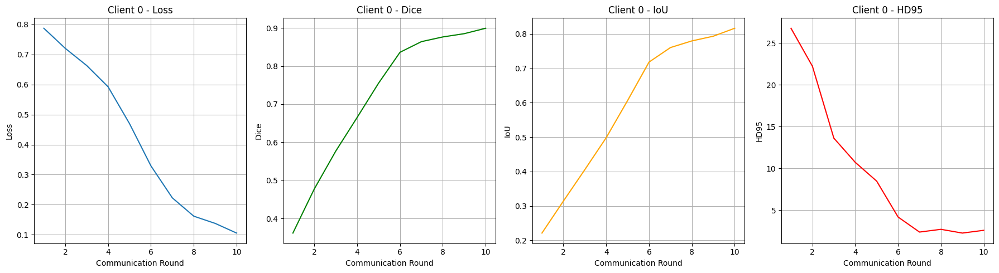

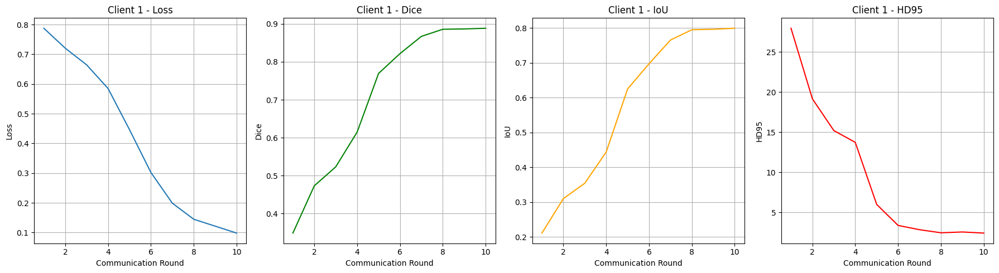

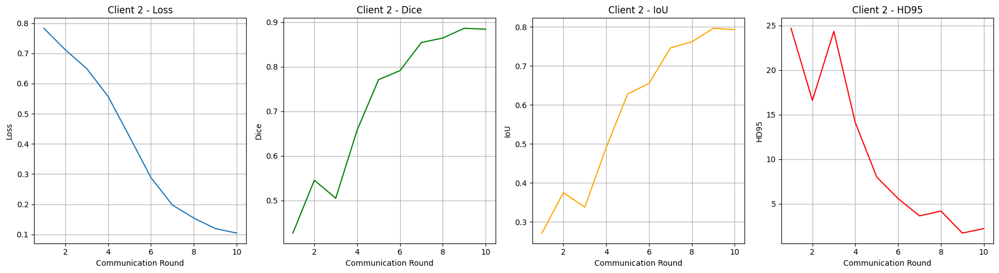

In [19]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

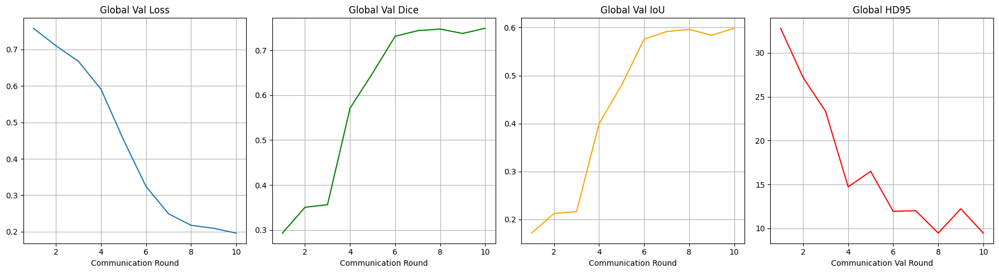

In [20]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [21]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_9420\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8,

Testing:  52%|█████▏    | 26/50 [00:01<00:01, 17.03it/s, Dice=0.6617, IoU=0.4944, HD95=9.4557] c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  52%|█████▏    | 26/50 [00:01<00:01, 17.03it/s, Dice=0.6372, IoU=0.4676, HD95=9.4557]c:\Users\LAB\AppData\Local\Programs\Python\Python310\lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:03<00:00, 16.38it/s, Dice=0.6994, IoU=0.5377, HD95=7.4197]


Test Set Metrics:
Dice: 0.6994
IoU: 0.5377
HD95: 7.4197


**Visualize**

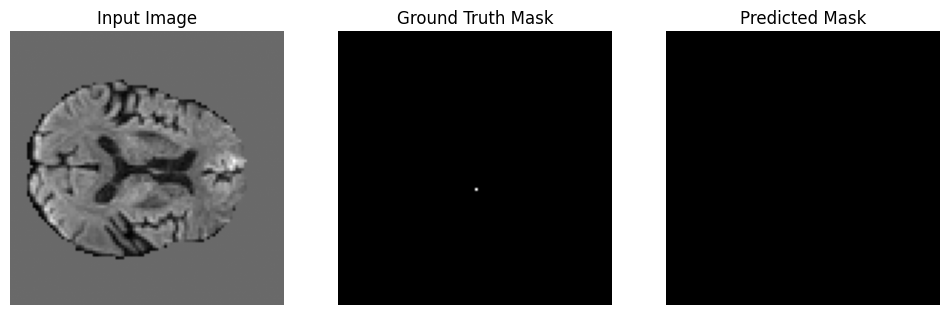

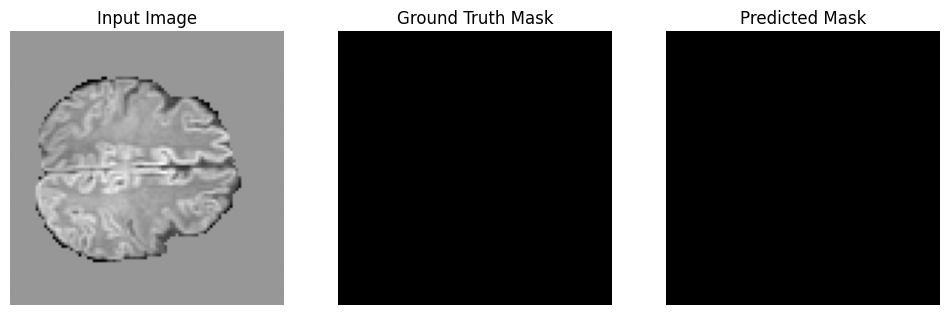

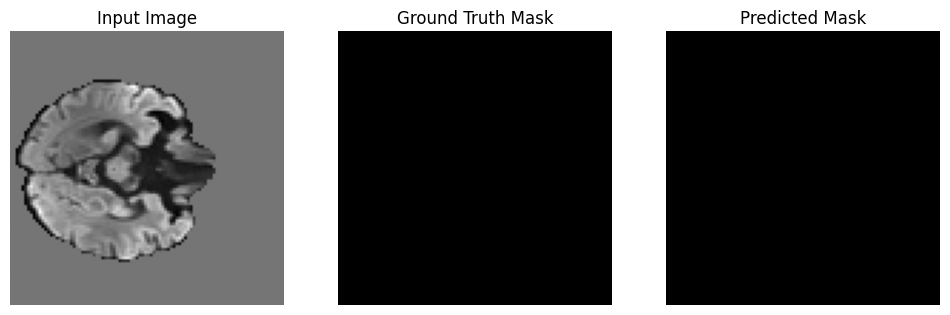

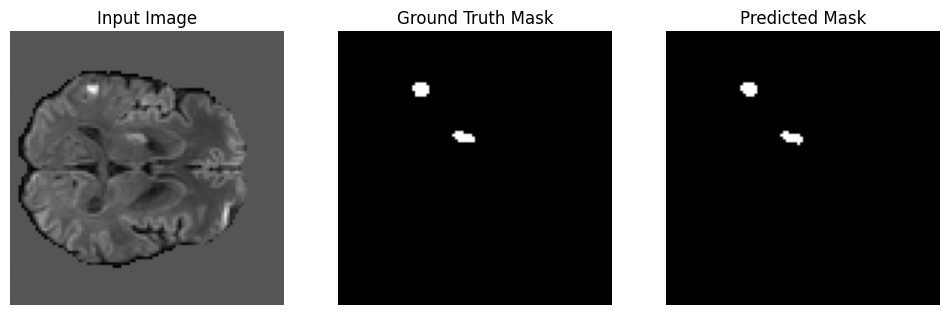

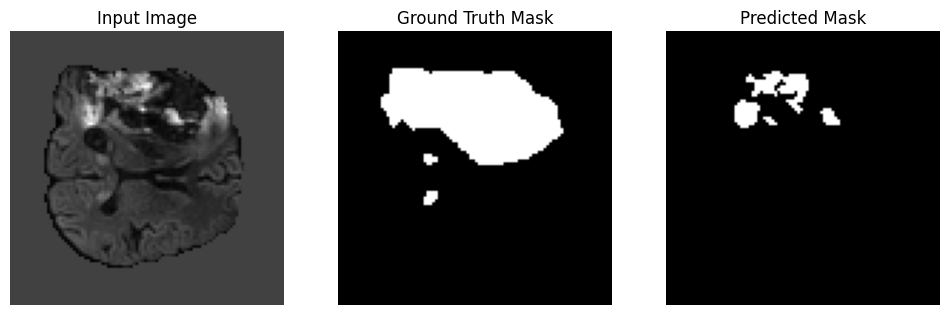

...

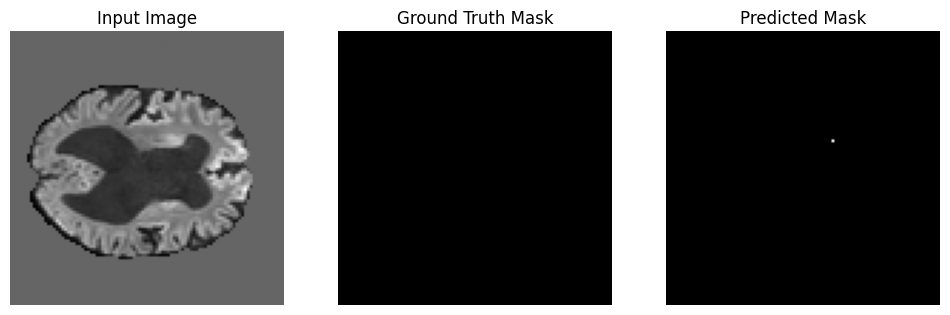

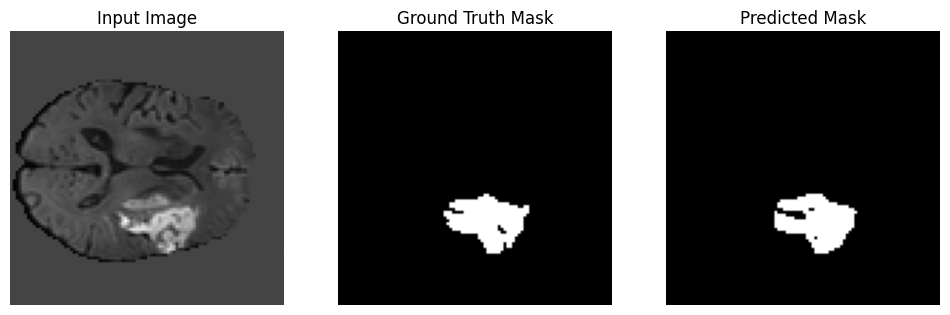

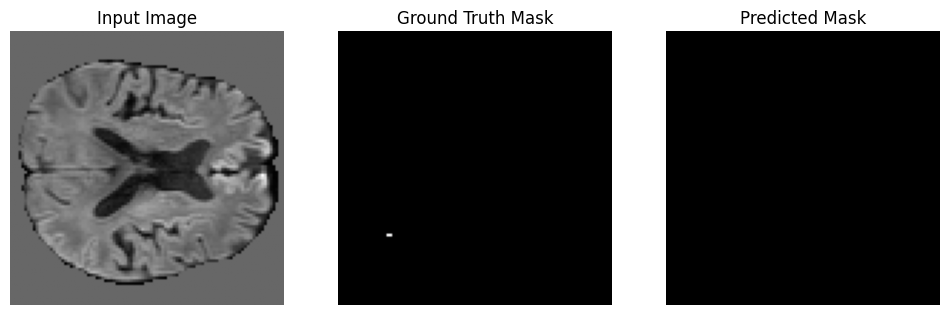

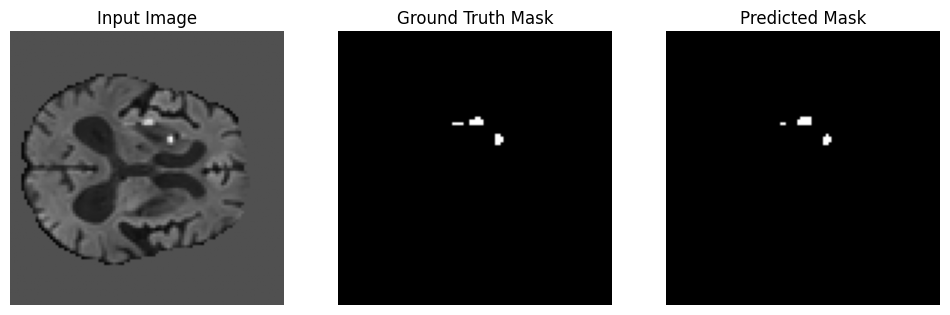

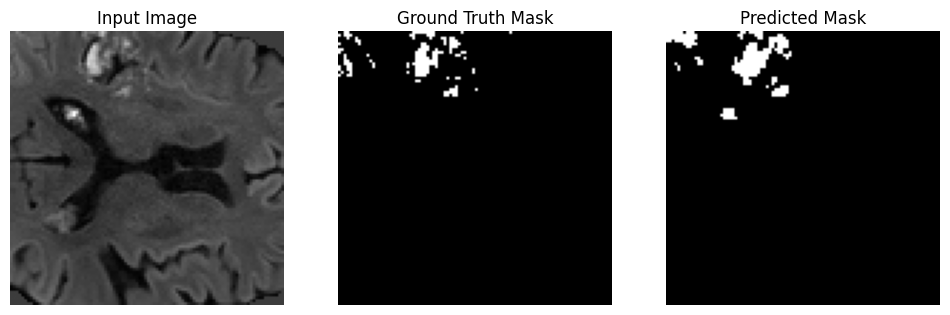

In [22]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()